<a href="https://colab.research.google.com/github/Tony6512/Internship-National-Lab/blob/main/DLDrilling_public.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

To optimize the drilling process and minimizing the cost, then optimizing the rate of pene
tration (ROP) and the mechincal specific energy (MSE) becomes necessary. Thus, modeling
these two features becomes important. We compare two approaches of modeling ROP and MSE. The first is called the PEF approach where a neural network (NN) is used to predict the MSE and ROP with input features weight of bit (WOB), rotation rate of the drill bit due to turning from the rotary table (RPM), the flow rate of the drilling, and well length.

In the IMP approach, the same inputs and the same neural network structure is used; however, the neural network now predicts the intermediate features depth of cut (DOC) and torque. Physics-based equations are used to predict the final targets ROP and MSE from the intermediate targets. We show that the IMP approach has a smaller error than the PEF approach for various neural network structures.

# Discussion of NN

For experiments we use a different number of hidden layers and a different number of units
per hidden layer. Though the hidden layers and units per hidden layer may change, there
are other attributes that remain the same for comparison purposes. Each neural network
produces all appropriate targets. That is, a neural network will have multiple outputs. Evidence has shown that a neural network having related multiple outputs may improve the error.

We normalize the data by using a batch normalization layer before the first dense hidden layer. It is necessary as many of the input features are of different order of magnitude. We use the elu activation function in each hidden layer along with He normal initialization of the weights to alleviate vanishing/exploding gradient. The only regularization used is early stopping. As we require a positive output, we use the softplus activation function in the output layer. Note
that the softplus and elu functions are in "Drawing Functions" section. The metric of interest is the RMSE, which is normalized via the range of the feature. The huber loss is used in the batch-wise training of batch size 32.

# Contents

In the IMP section, we use the IMP approach. We build the model, fit it, and use the physics-based equations to get the desired output. Some plots are provided to view the output.

In the PEF section, we use the PEF approach. We build the model, and fit it. Some plots are provided to view the output.

After that, we a few plots are created with both the PEF and IMP predictions for comparison.

Various stacking methods are attempted. This includes combining the IMP and PEF models, as well as stacking multiple IMP models (different number of units and hidden layers). We try converting the intermediate features before (1) and after (2) using the meta-learner.

We temperarily move away from neural networks to focus on other machine learning (ML) algorithms, in particular, trees. We use the IMP approach here.

Evaluating feature importance is important. We use permutation importance to gain insight of what features the IMP and PEF models find importance.

# pip install

In [ ]:
pip install eli5

In [ ]:
!pip install keras-tuner -q

# Intro

In [ ]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import random as rnd

# visualization
import seaborn as sns
sns.set(style="darkgrid")
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
import time
from time import perf_counter

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor

from sklearn.model_selection import KFold
from sklearn.model_selection import TimeSeriesSplit
# from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier,
# BaggingClassifier, HistGradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier, StackingClassifier)

from sklearn.ensemble import (RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor,
BaggingRegressor, HistGradientBoostingRegressor, ExtraTreesRegressor, VotingRegressor, StackingRegressor)
from sklearn.multioutput import MultiOutputRegressor
import xgboost as xgb
from xgboost import XGBRegressor

from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import roc_curve, auc, r2_score
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

SEED = 0


In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
import eli5
from eli5.sklearn import PermutationImportance
from eli5.permutation_importance import get_score_importances

In [ ]:
# df_train = ### data goes here

In [ ]:
df_train.dtypes

LPN                      object
ld                       object
w                        object
r                        object
f                        object
p                        object
q                        object
s                        object
dp                       object
Azmuth                   object
Inclination              object
t_used                   object
d                        object
h                        object
mse                      object
dse                      object
p_mse                    object
p_dse                    object
duration_t               object
duration_ld              object
rk                       object
s2f                      object
qv                       object
df(bending_deg*dfc)      object
c_vol_f                  object
PressureDrop_s0          object
hook_load                object
GBoB                     object
wob_hkl_ref              object
del_bit_position         object
Lin_d_w                  object
sigm_ben

In [ ]:
df_train.head()

,LPN,ld,w,r,f,p,q,s,dp,Azmuth,...,wob_hkl_ref,del_bit_position,Lin_d_w,sigm_bending,w_cal,r_s_strength,s_s_severity,Gamma_at_Bit,Block_Height,be(bending_energy*dfc
0,num,ft,k-lb,RPM,gpm,ft/hr.,k-ft.-lb,psi,psi,deg.,...,k-lb,ft,inch/k-lb,k lb,w_cal,drilling status,drilling status,tbd,ft,ft^2-lb
1,0,7840.125,21.789,49.507,445.616,134.02,10.455,2941.82,588.918,11.46,...,1.062,0.361,0,0,45.469926,0,0,112.94,68.015,0
2,0,7840.158,21.761,49.384,444.789,133.767,9.141,2947.81,594.914,11.46,...,2.011,0.394,0,135313236.100084,-88.896899,0,0,112.94,67.669,0
3,0,7841.011,22.822,49.507,445.616,133.429,10.377,2972.09,619.195,11.46,...,-0.251,0.853,0,537478.87647,45.618206,0,0,112.94,67.642,0
4,1,7841.175,22.739,49.507,444.797,104.28,11.535,2988.958,636.053,11.46,...,-1.816,1.017,0,384205.520343,44.193857,0,0,112.94,66.761,0


In [ ]:
df_train['d'][0] ## unit check

'inch/rev.'

In [ ]:
df_train = df_train.loc[1:,:] ## exclude unit row

In [ ]:
df_train = df_train.astype('double')  ## convert to correct type

In [ ]:
df_train.head()

,LPN,ld,w,r,f,p,q,s,dp,Azmuth,...,wob_hkl_ref,del_bit_position,Lin_d_w,sigm_bending,w_cal,r_s_strength,s_s_severity,Gamma_at_Bit,Block_Height,be(bending_energy*dfc
1,0.0,7840.125,21.789,49.507,445.616,134.020,10.455,2941.820,588.918,11.46,...,1.062,0.361,0.000000,0.000000e+00,45.469926,0.0,0.0,112.94,68.015,0.0
2,0.0,7840.158,21.761,49.384,444.789,133.767,9.141,2947.810,594.914,11.46,...,2.011,0.394,0.000000,1.353132e+08,-88.896899,0.0,0.0,112.94,67.669,0.0
3,0.0,7841.011,22.822,49.507,445.616,133.429,10.377,2972.090,619.195,11.46,...,-0.251,0.853,0.000000,5.374789e+05,45.618206,0.0,0.0,112.94,67.642,0.0
4,1.0,7841.175,22.739,49.507,444.797,104.280,11.535,2988.958,636.053,11.46,...,-1.816,1.017,0.000000,3.842055e+05,44.193857,0.0,0.0,112.94,66.761,0.0
5,2.0,7841.208,19.414,49.683,445.608,102.184,8.365,2993.816,640.916,11.46,...,-97.767,1.050,-0.015815,3.613824e+05,40.611140,0.0,0.0,112.94,66.761,0.0


In [ ]:
df_train.describe()

,LPN,ld,w,r,f,p,q,s,dp,Azmuth,...,wob_hkl_ref,del_bit_position,Lin_d_w,sigm_bending,w_cal,r_s_strength,s_s_severity,Gamma_at_Bit,Block_Height,be(bending_energy*dfc
count,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,...,19233.000000,19233.000000,19233.000000,1.923300e+04,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000,19233.000000
mean,9614.000156,10753.158519,17.810775,63.074834,456.520843,125.769101,10.553898,3196.926437,463.600421,131.294322,...,8.259208,33.473136,0.003582,7.540551e+03,32.594684,0.331568,5.244437,234.315174,78.493806,40798.633576
std,5552.232929,1899.598714,6.305409,26.474645,14.808217,59.443086,3.408023,398.986442,175.648332,45.032956,...,8.595265,28.028269,0.007627,9.759072e+05,7.486835,13.623146,19.957692,92.897615,27.354672,18453.191031
min,0.000000,7840.125000,0.028000,8.547000,341.001000,9.992000,3.165000,1609.487000,0.391000,3.570000,...,-97.767000,0.032000,-0.059390,0.000000e+00,-88.896899,0.000000,0.000000,-999.250000,27.085000,0.000000
25%,4806.000000,8980.709000,12.989000,39.580000,451.367000,73.526000,7.447000,2858.800000,325.175000,142.940000,...,2.960000,10.498000,-0.000321,5.786918e+00,26.351401,0.000000,0.000000,188.240000,55.330000,33819.684047
50%,9614.000000,10487.566000,18.018000,69.537000,459.588000,131.940000,10.407000,3159.566000,525.493000,144.240000,...,6.844000,26.477000,0.000815,7.091247e+00,33.460097,0.000000,0.000000,211.760000,77.968000,45276.393670
75%,14422.000000,12324.114000,22.515000,85.689000,459.588000,178.814000,13.348000,3543.713000,610.855000,145.600000,...,13.185000,50.591000,0.007669,1.650796e+01,38.548442,0.000000,0.000000,254.120000,101.893000,52919.900469
max,19230.000000,14454.035000,39.415000,100.941000,494.797000,259.287000,20.050000,3987.066000,783.317000,175.530000,...,37.684000,186.614000,0.086124,1.353132e+08,51.855602,725.450000,429.235880,2599.000000,129.801000,110792.673051


In [ ]:
### choosing the features we are interested in
df = df_train.iloc[:,[1,2,3,4,5,6,7,8,12,14]]
# df = df_train.iloc[:,[1:8,12,14]]

In [ ]:
df

,ld,w,r,f,p,q,s,dp,d,mse
1,7840.125,21.789,49.507,445.616,134.020,10.455,2941.820,588.918,0.153799,104.097157
2,7840.158,21.761,49.384,444.789,133.767,9.141,2947.810,594.914,0.153822,101.655735
3,7841.011,22.822,49.507,445.616,133.429,10.377,2972.090,619.195,0.153121,108.413152
4,7841.175,22.739,49.507,444.797,104.280,11.535,2988.958,636.053,0.119828,144.928438
5,7841.208,19.414,49.683,445.608,102.184,8.365,2993.816,640.916,0.117148,138.773246
...,...,...,...,...,...,...,...,...,...,...
19229,14452.297,23.744,99.900,459.588,198.562,16.180,3925.787,655.782,0.173732,115.004684
19230,14452.757,23.800,99.865,459.588,196.515,15.847,3932.894,662.892,0.171967,115.718682
19231,14453.281,23.297,100.006,459.588,184.820,15.854,3931.763,661.759,0.161633,122.998876
19232,14453.806,23.297,99.883,459.588,180.966,15.693,3928.572,658.575,0.158348,124.625329


Let us see what percent of the data is under a certain value.

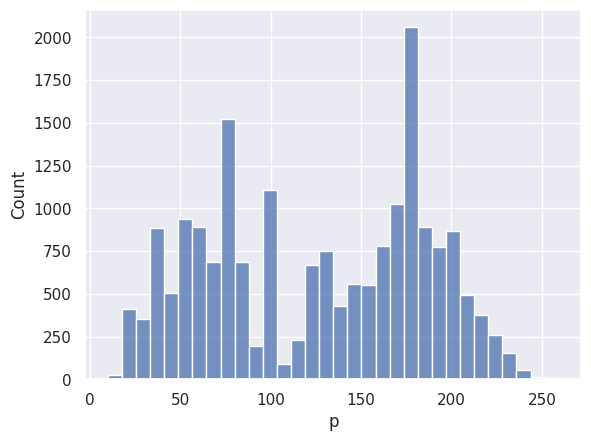

In [ ]:
sns.histplot(data=df, x="p") ## rop
None

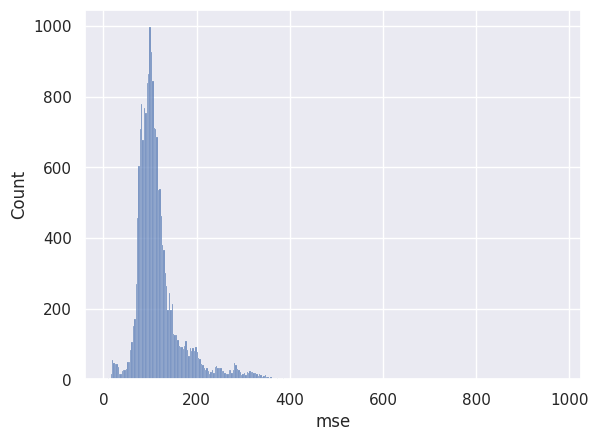

In [ ]:
sns.histplot(data=df, x="mse")
None

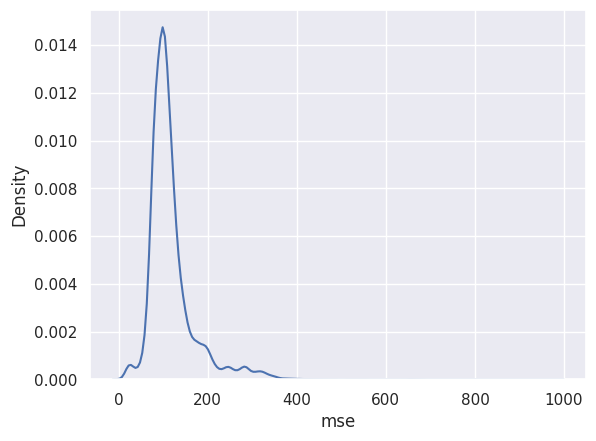

In [ ]:
sns.kdeplot(data=df, x="mse")
None

In [ ]:
## Let us exclude outliers

In [ ]:
mse_values = df['mse'].values ## could use .to_numpy() instead

In [ ]:
mse_values = sorted(mse_values)

In [ ]:
percent_idx = 0.999*len(mse_values)

In [ ]:
mse_values[int(percent_idx)+1]

430.471625448264

Remove instances of large values of MSE.

In [ ]:
df[df['mse'] > 344].index  ### 99.9% of mse values are below 343

Int64Index([  357,  2837,  2838,  2839,  2840,  2841,  2842,  2844,  2845,
             2846,  2847,  2850,  2852,  2853,  2884,  2890,  2891,  3435,
             3436,  3437,  3438,  3652,  3653,  3654,  3655,  5592,  6040,
             6042,  6043,  6044,  6045,  6046,  6048,  6049,  6050,  6054,
             6055,  6056,  7657,  7783,  9905, 10606, 10811, 11047, 11426,
            11475, 11522, 11562, 12103, 12285, 12356, 12811, 12849, 12865,
            13138, 13163, 13815, 13911, 14206, 14255, 14352, 14353, 14659,
            14660, 15466, 15573, 15652, 15728, 16089, 16110, 16131, 16178,
            16663, 16825, 17123, 18305, 19014, 19015],
           dtype='int64')

In [ ]:
df = df.drop(df[df['mse'] > 344].index)

In [ ]:
df = df.reset_index(drop = True)

In [ ]:
df

,ld,w,r,f,p,q,s,dp,d,mse
0,7840.125,21.789,49.507,445.616,134.020,10.455,2941.820,588.918,0.153799,104.097157
1,7840.158,21.761,49.384,444.789,133.767,9.141,2947.810,594.914,0.153822,101.655735
2,7841.011,22.822,49.507,445.616,133.429,10.377,2972.090,619.195,0.153121,108.413152
3,7841.175,22.739,49.507,444.797,104.280,11.535,2988.958,636.053,0.119828,144.928438
4,7841.208,19.414,49.683,445.608,102.184,8.365,2993.816,640.916,0.117148,138.773246
...,...,...,...,...,...,...,...,...,...,...
19150,14452.297,23.744,99.900,459.588,198.562,16.180,3925.787,655.782,0.173732,115.004684
19151,14452.757,23.800,99.865,459.588,196.515,15.847,3932.894,662.892,0.171967,115.718682
19152,14453.281,23.297,100.006,459.588,184.820,15.854,3931.763,661.759,0.161633,122.998876
19153,14453.806,23.297,99.883,459.588,180.966,15.693,3928.572,658.575,0.158348,124.625329


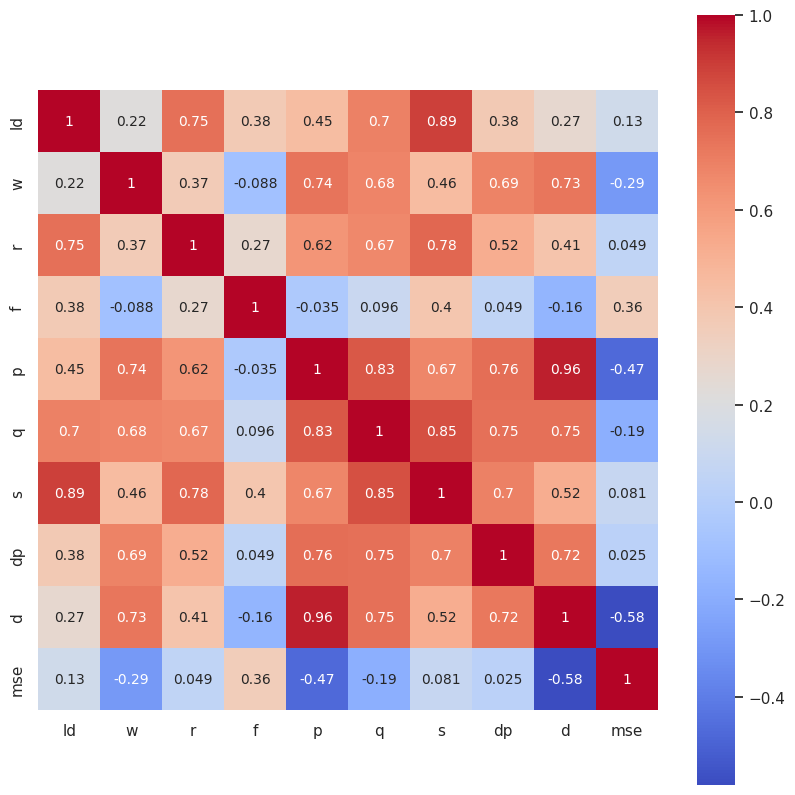

In [ ]:
fig, axs = plt.subplots(nrows=1, figsize=(10, 10))

sns.heatmap(df.corr(method = 'pearson'),  annot=True, square=True, cmap='coolwarm', annot_kws={'size': 10})
plt.show()

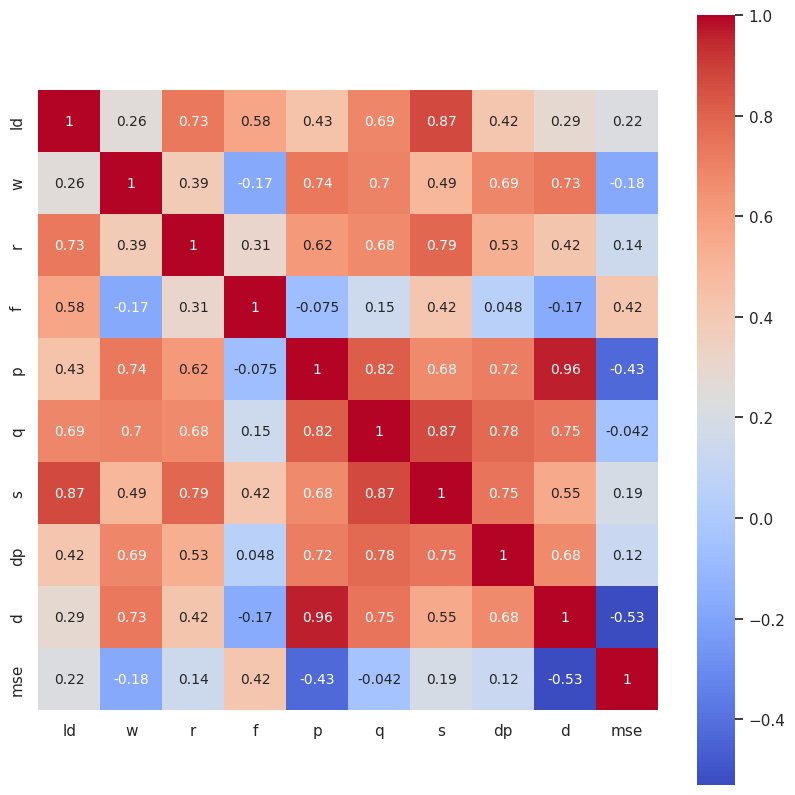

In [ ]:
fig, axs = plt.subplots(nrows=1, figsize=(10, 10))

sns.heatmap(df.corr(method = 'spearman'),  annot=True, square=True, cmap='coolwarm', annot_kws={'size': 10})
plt.show()

## Number of samples

In [ ]:
sample_num = df.shape[0];
df_small = df.iloc[0:sample_num,:]
df_small.shape

(19155, 10)

In [ ]:
labels = ['Well Length' , 'WOB', 'RPM', 'Flow', 'ROP', 'Torque', 'SPP', 'Differential Pressure', 'DOC', 'MSE']

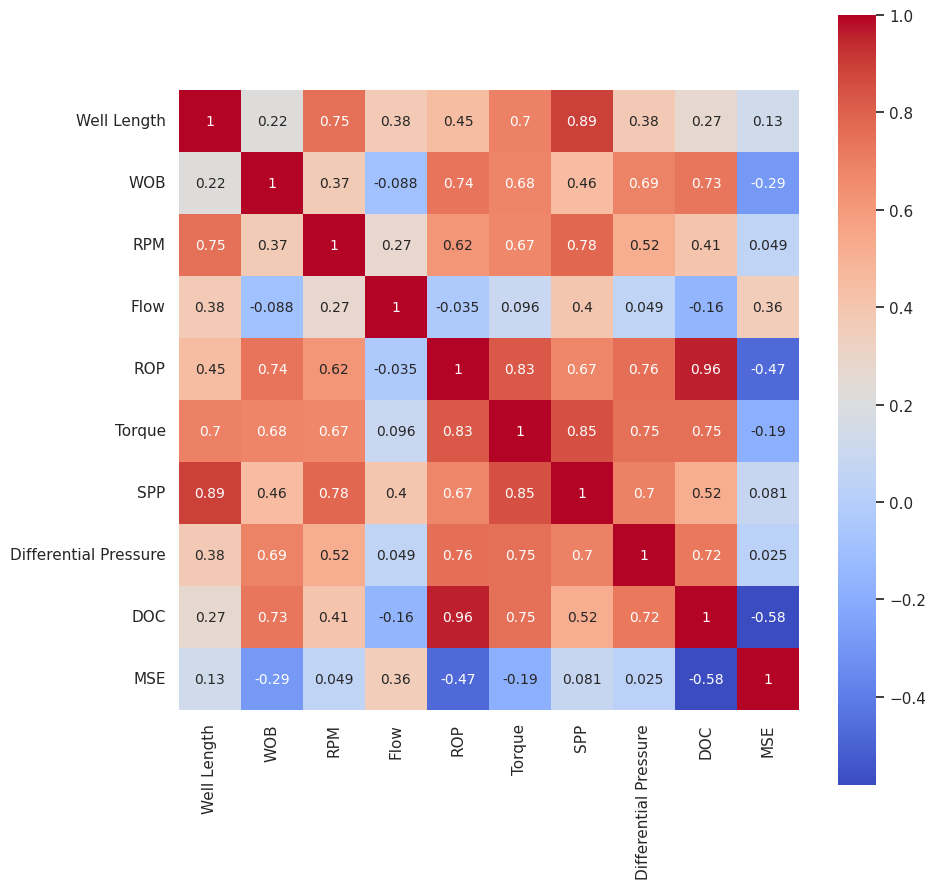

In [ ]:
fig, axs = plt.subplots(nrows=1, figsize=(10, 10))

sns.heatmap(df_small.corr(method = 'pearson'),  annot=True, square=True,
            xticklabels = labels, yticklabels = labels ,cmap='coolwarm', annot_kws={'size': 10})
plt.show()

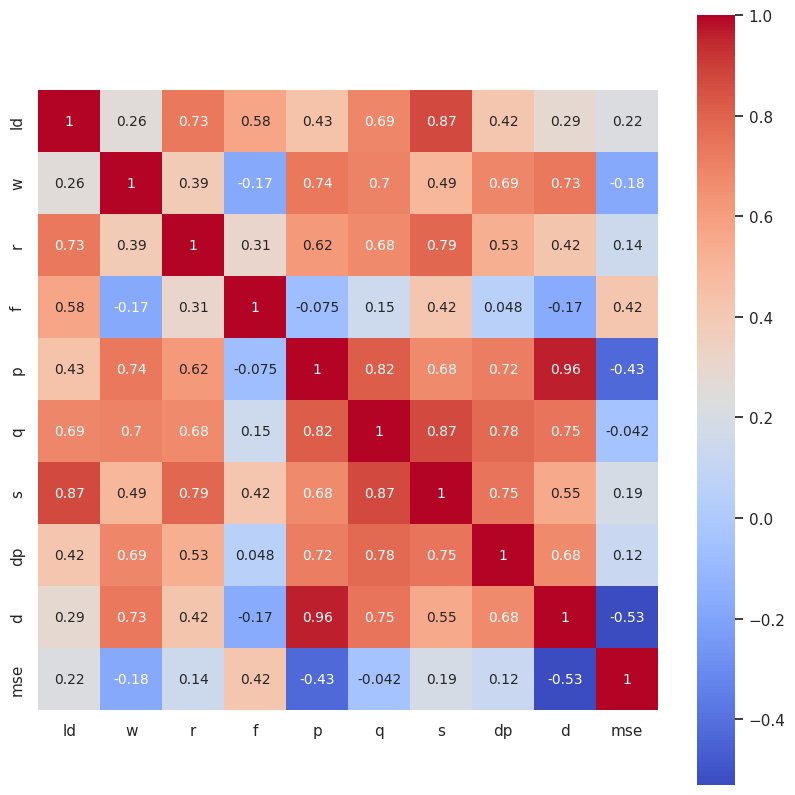

In [ ]:
fig, axs = plt.subplots(nrows=1, figsize=(10, 10))

sns.heatmap(df_small.corr(method = 'spearman'),  annot=True, square=True, cmap='coolwarm', annot_kws={'size': 10})
plt.show()

In [ ]:
# !pip install keras-tuner -q

In [ ]:
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer

from tensorflow import keras
from tensorflow.keras import layers
import keras_tuner

In [ ]:
df_small.describe()

,ld,w,r,f,p,q,s,dp,d,mse
count,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000,19155.000000
mean,10753.888993,17.830146,63.065438,456.470790,126.148215,10.563970,3196.845250,463.377889,0.129338,116.331391
std,1899.925569,6.301964,26.466027,14.803314,59.261227,3.404714,399.044769,175.694139,0.053012,48.702092
min,7840.125000,0.028000,8.547000,341.001000,9.992000,3.165000,1609.487000,0.391000,0.016858,9.258449
25%,8981.595000,13.045000,39.580000,446.435000,73.733500,7.455000,2858.554000,325.126500,0.077811,87.877313
50%,10487.697000,18.046000,69.537000,459.588000,132.457000,10.411000,3159.624000,525.258000,0.143839,104.362871
75%,12325.493000,22.543000,85.689000,459.588000,178.840000,13.359000,3543.539000,610.678000,0.174726,127.454413
max,14454.035000,39.415000,100.941000,494.797000,259.287000,20.050000,3976.753000,783.317000,0.300742,343.661913


Lag plots show that the data is not random and depends on past events.

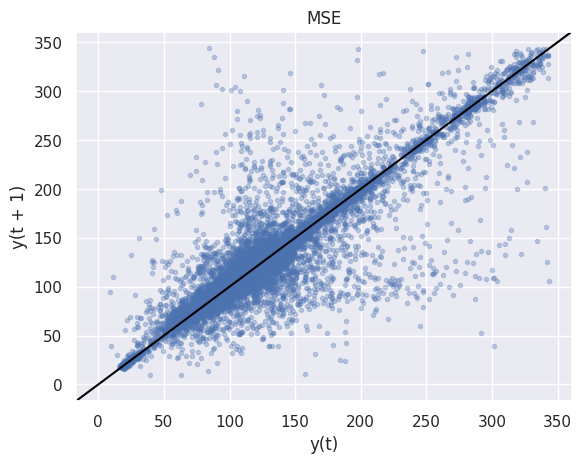

In [ ]:
pd.plotting.lag_plot(df_small['mse'],lag = 1, alpha = 0.3, marker = '.')
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('MSE')
plt.show()
None

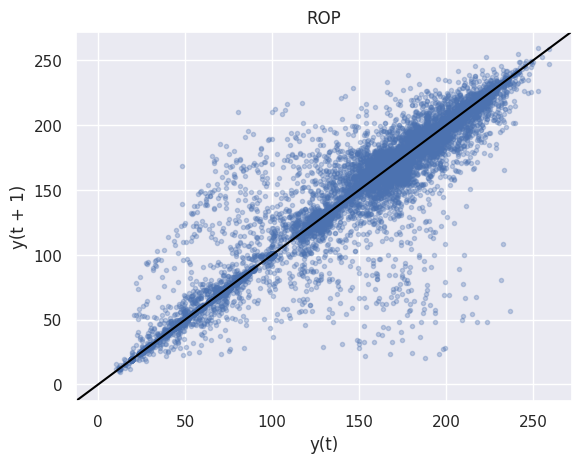

In [ ]:
pd.plotting.lag_plot(df_small['p'],lag = 1, alpha = 0.3, marker = '.')
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('ROP')
plt.show()
None

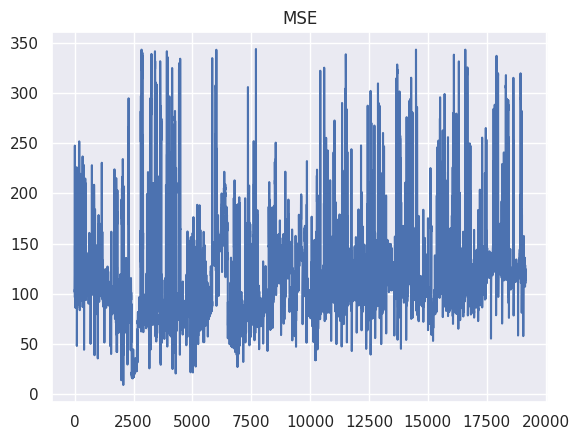

In [ ]:
plt.plot(df_small['mse'])
plt.title('MSE')
None

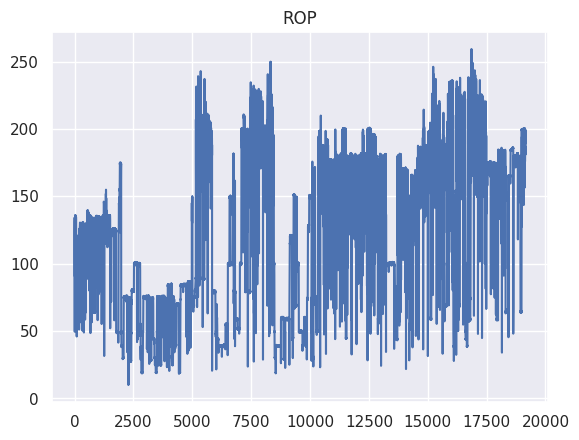

In [ ]:
plt.plot(df_small['p'])
plt.title('ROP')
None

In [ ]:
X = df_small.loc[:,['ld', 'w', 'r', 'f', 'dp']]  ## well length (ld), WOB (w), RPM (r), Flow (f)
IMP = df_small.loc[:,['q', 's', 'd']]  ## should contain Torque (q), SPP (s), DOC (d)
PEF = df_small.loc[:,['p', 'mse']]  ## should contain ROP (p) and MSE (mse)

Random split

In [ ]:
X_train_pd, X_test_pd, IMP_train, IMP_test = train_test_split(X, IMP, test_size = 0.2, random_state = SEED)

In [ ]:
X_train_PEF, X_test_PEF, PEF_train, PEF_test = train_test_split(X, PEF, test_size = 0.2, random_state = SEED)

In [ ]:
all([a == b for a, b in zip(X_train_pd, X_train_PEF)]) ## X_train and X_train_PEF are the same (b/c we used same random state)

True

In [ ]:
dp_train = np.array(X_train_pd.iloc[:,-1]) ## _pd is a pandas dataframe that we are converting to an array
X_train = np.array(X_train_pd.iloc[:,:-1])
dp_test = np.array(X_test_pd.iloc[:,-1])
X_test = np.array(X_test_pd.iloc[:,:-1])

In [ ]:
X_train.shape

(15324, 4)

# IMP

In [ ]:
y_train = IMP_train.values[:,[0,2]]
y_test = IMP_test.values[:,[0,2]]
# y_train = PEF_train.values
# y_test = PEF_test.values

In [ ]:
if len(y_train.shape) ==1:
  y_train = y_train.reshape(-1,1)
  y_test = y_test.reshape(-1,1)

In [ ]:
## custom activation function
## positive elu
def pos_elu(x):
  return keras.activations.elu(x) + 1.01

## Model

In [ ]:
def build_model(hp):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_train.shape[1])
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)


  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
# opt = keras.optimizers.Adam(learning_rate=0.001) ## 0.001 works well, had issues with 0.0001
# # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
# #     initial_learning_rate=1e-3,
# #     decay_steps=1000,
# #     decay_rate=0.8)

# model.compile(
#     # optimizer='adam',
#     optimizer = opt,
#     loss='mean_squared_error',
#     metrics=['mean_squared_error'],
# )

In [ ]:
# tuner = keras_tuner.BayesianOptimization(
#     hypermodel= build_model,
#     objective='val_mean_squared_error',
#     max_trials=20,
#     seed = SEED,
#     # if True, overwrite above directory if search is run again - i.e. don't resume
#     overwrite = True)
# tuner.search_space_summary()

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
    min_delta=0.001,
    start_from_epoch = 30,
    restore_best_weights=True,
)

In [ ]:
# tuner.search(X_train, y_train, validation_split=0.2, callbacks=[early_stopping])

In [ ]:
# # Get the top  models.
# models = tuner.get_best_models(num_models=5)
# # for model in models:
# #     model.build(input_shape = [None, X_train_full.shape[1]])
# #     model.summary()
# best_model = models[0]
# # Build the model.
# # Needed for `Sequential` without specified `input_shape`.
# # input_shape = [None, X_train_full.shape[1]]
# best_model.build(input_shape = [None, X_train.shape[1]])
# best_model.summary()

In [ ]:
# tuner.results_summary()

In [ ]:
# # Get the top 5 hyperparameters.
# best_hps = tuner.get_best_hyperparameters(5)
# # Build the model with the best hp.
# model = build_model(best_hps[0])
# # Fit with the entire dataset.
# # model.fit(X_train_full, y_train_full, epochs=1)
# # tensorboard_callback = keras.callbacks.TensorBoard(histogram_freq=1)
# history = model.fit(
#     X_train, y_train,
# #     validation_data=(X_valid, y_valid),
#     validation_split = 0.2,
#     batch_size=128,
#     epochs=1000,
#     callbacks=[early_stopping]#, tensorboard_callback],
# )

In [ ]:
model = build_model(1)

## Fitting

In [ ]:
tic = perf_counter()
history = model.fit(
    X_train, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2470 - root_mean_squared_error: 0.8657 - val_loss: 0.2097 - val_root_mean_squared_error: 0.7915
Epoch 2/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2502 - root_mean_squared_error: 0.8723 - val_loss: 0.2131 - val_root_mean_squared_error: 0.8178
Epoch 3/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2466 - root_mean_squared_error: 0.8661 - val_loss: 0.2099 - val_root_mean_squared_error: 0.7797
Epoch 4/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2430 - root_mean_squared_error: 0.8559 - val_loss: 0.2093 - val_root_mean_squared_error: 0.7966
Epoch 5/200
384/384 [==============================] - 2s 6ms/step - loss: 0.2472 - root_mean_squared_error: 0.8668 - val_loss: 0.2214 - val_root_mean_squared_error: 0.8023
Epoch 6/200
384/384 [==============================] - 3s 7ms/step - loss: 0.2461 - root_mean_squared_error: 0.8621 - val_loss: 0.2179 

In [ ]:
# history.history

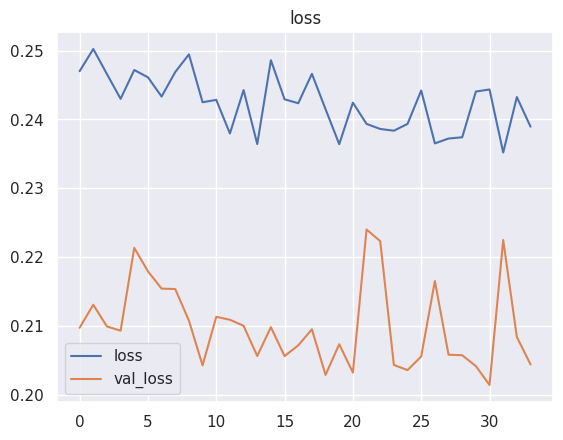

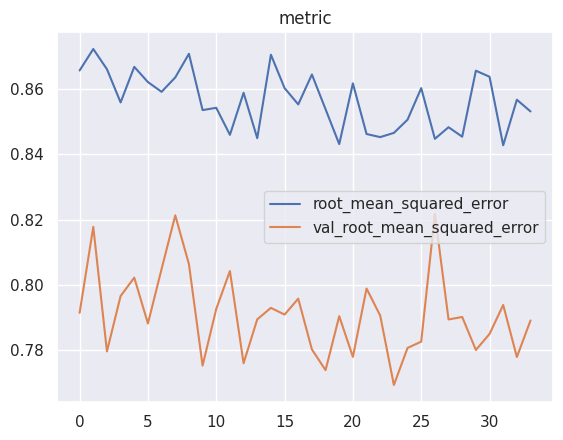

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[:, [0, 2]].plot(title="loss")
history_df.iloc[:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
start = history_df.shape[0] // 4

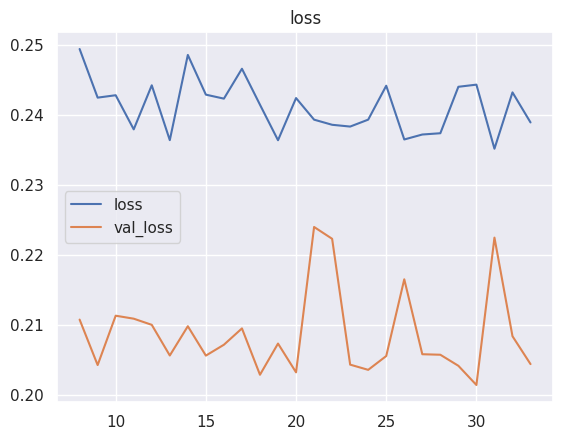

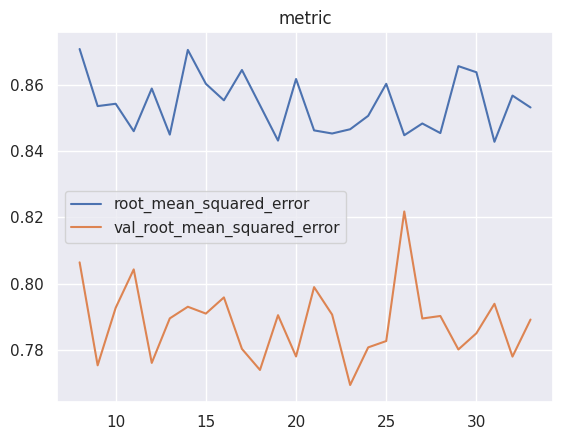

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[start:, [0, 2]].plot(title="loss")
history_df.iloc[start:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
y_pred = model.predict(X_test)

120/120 [==============================] - 0s 3ms/step


In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 4)]               0         
                                                                 
 batch_normalization_1 (Batc  (None, 4)                16        
 hNormalization)                                                 
                                                                 
 dense_3 (Dense)             (None, 256)               1280      
                                                                 
 dense_4 (Dense)             (None, 256)               65792     
                                                                 
 dense_5 (Dense)             (None, 2)                 514       
                                                                 
Total params: 67,602
Trainable params: 67,594
Non-trainable params: 8
_______________________________________________________

In [ ]:
# y_test.shape

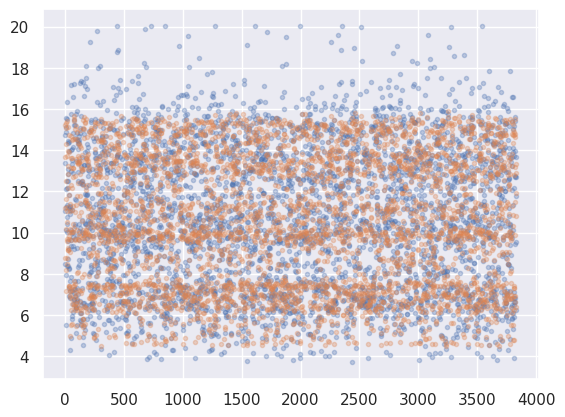

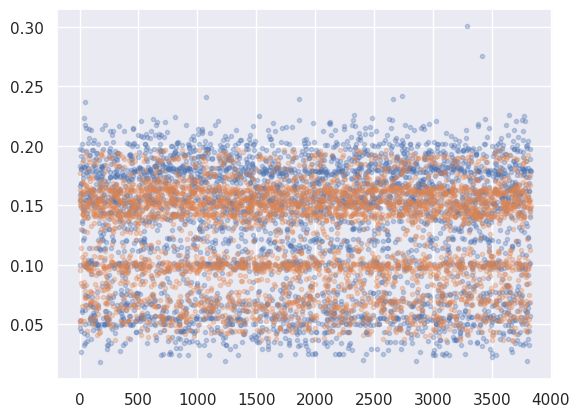

In [ ]:
### plot output (intermediate values)
for i in range(y_test.shape[1]):
  plt.plot(y_test[:,i],'.', alpha = 0.3)
  plt.plot(y_pred[:,i],'.', alpha = 0.3)
  # plt.ylim([0,250])
  plt.show()

In [ ]:
## verify no negative values
print(f'number of negative values {sum(y_pred[:,-1] < 0)}')

number of negative values 0


In [ ]:
idx = y_pred[:,-1] > 0 ## crit 2 (for DOC)
y_test = y_test[idx,:]
y_pred = y_pred[idx,:]

In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
## compute loss and normalized loss for each output
for i in range(y_test.shape[1]):
  print(f'loss: {loss_fct(y_test[:,i], y_pred[:,i])}, Nloss: {loss_fct(y_test[:,i], y_pred[:,i]) / (np.max(y_test[:,i]) - np.min(y_test[:,i]) ) }')

loss: 1.1900819540023804, Nloss: 0.07296191900968552
loss: 0.9718245267868042, Nloss: 2.9799447059631348


In [ ]:
## compute error for each output
for j in range(y_test.shape[1]):
  err_i = 2 * abs(y_test[:,j] - y_pred[:,j]) / (y_test[:,j] + y_pred[:,j])
  err =  sum(err_i) / len(err_i)         ## err_i* 0.32 / (len(err_i)*0.32)   ## weighted sum using the avg weight ... the weights cancel
                                    ## by using avg weight we turn the weighted avg into just an avg

  print(f'err = {err}')

err = 0.0739243126764113
err = 0.1824574374071508


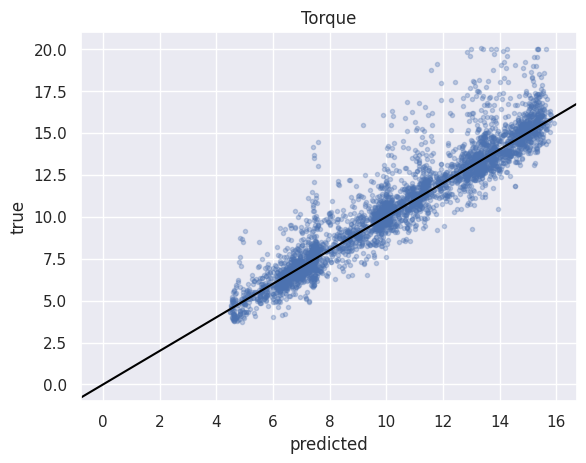

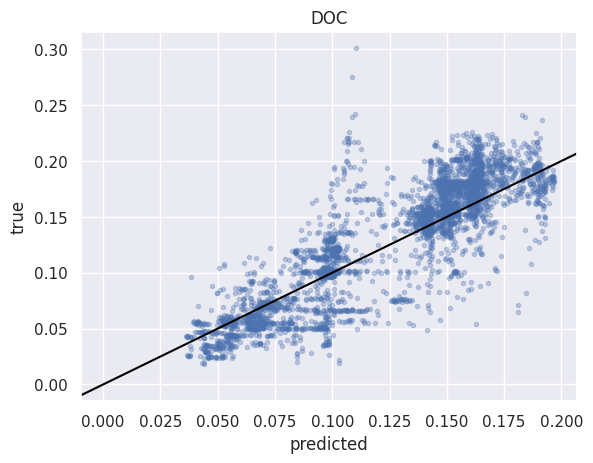

In [ ]:
plt.plot(y_pred[:,0], y_test[:,0], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('Torque')
plt.xlabel('predicted')
plt.ylabel('true')
plt.show()
plt.plot(y_pred[:,-1], y_test[:,-1], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('DOC')
plt.xlabel('predicted')
plt.ylabel('true')
plt.show()

In [ ]:
print(f'r2 score {r2_score(y_test[:,0], y_pred[:,0])}')
print(f'r2 score {r2_score(y_test[:,-1], y_pred[:,-1])}')

r2 score 0.8796804819612829
r2 score 0.740531362591258


In [ ]:
# X = df_small.iloc[:,0:4]  ## well length (ld), WOB (w), RPM (r), Flow (f)
# IMP = df_small.iloc[:,5:8]  ## should contain Torgque (q), SPP (s), DOC (d)
# PEF = df_small.iloc[:,[4,8]]  ## should contain ROP (p) and MSE (mse)

## Final Targets

In [ ]:
# ROP =
def ROP(DOC, RPM, Flow):
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  RPMM = K * Flow;
  return DOC*(RPM+ RPMM) * 5 ## converting inch/min to ft/hr

In [ ]:
# MSE =
def MSE(ROP, Torque, WOB, RPM, Flow, dp):
  A_B = np.pi * (8.5/2)**2; ## np.pi * rad^2 , diameter of the bit is 8.5“ (inches)
  T_max = 15.02;# ft-kilo lb #2.074; # meter-ton
  dp_max = 700; # psi   # 49.2; # kg/cm**2
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  TM = T_max * dp / dp_max;
  RPMM = K * Flow;
  return (WOB*ROP+ 60*2*np.pi *RPM*Torque + 60*2*np.pi*RPMM*TM) / (A_B*ROP)

In [ ]:
ROP_value = ROP(y_pred[:,-1], X_test[idx,2], X_test[idx,3])
MSE_value = MSE(ROP_value, y_pred[:,0], X_test[idx,1], X_test[idx,2], X_test[idx,3], dp_test[idx])
print(f'loss: {loss_fct(PEF_test.values[idx,0], ROP_value)}, Nloss: {loss_fct(PEF_test.values[idx,0], ROP_value) / (np.max(PEF_test.values[idx,0]) - np.min(PEF_test.values[idx,0]) )}') ## ROP error
print(f'loss: {loss_fct(PEF_test.values[idx,1], MSE_value)}, Nloss: {loss_fct(PEF_test.values[idx,1], MSE_value) / (np.max(PEF_test.values[idx,1]) - np.min(PEF_test.values[idx,1]) )}') ## MSE

loss: 11.386390686035156, Nloss: 0.061208326369524
loss: 18.755186080932617, Nloss: 0.06382964551448822


In [ ]:
predictions = np.array([ROP_value, MSE_value]).T
for j in range(predictions.shape[1]):
  truth = PEF_test.values[idx,j];
  pred = predictions[:,j]
  # err_i = abs(truth - pred) / (truth)
  err_i = 2 * abs(truth - pred) / (truth + pred)
  err =  sum(err_i) / len(err_i)         ## err_i* 0.32 / (len(err_i)*0.32)   ## weighted sum using the avg weight ... the weights cancel
  print(f'err = {err}')

err = 0.1823878557365188
err = 0.17562363170357922


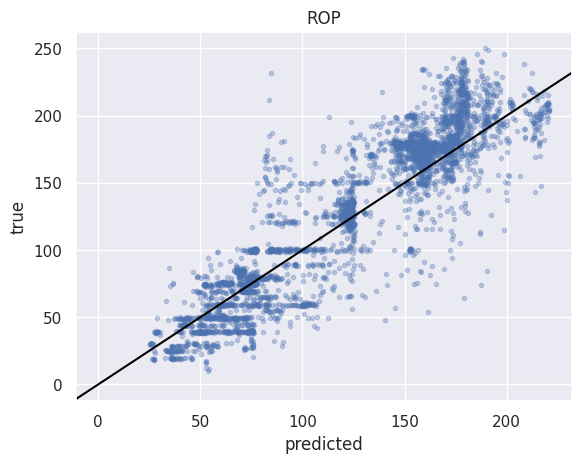

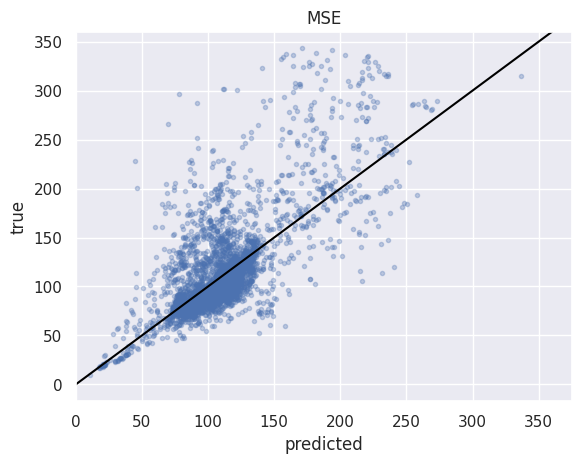

In [ ]:
plt.plot(ROP_value, PEF_test.values[idx,0], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
# plt.plot(ROP_value, ROP_value, 'k-')
plt.title('ROP')
plt.xlabel('predicted')
plt.ylabel('true')
plt.show()
plt.plot(MSE_value, PEF_test.values[idx,1], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('MSE')
plt.xlabel('predicted')
plt.ylabel('true')
plt.xlim([0,375])
# plt.ylim([0,400])
plt.show()

In [ ]:
idx_pef = PEF_test.values[:,-1]<800 ## excluding outlier
print(f'r2 score {r2_score(ROP_value, PEF_test.values[idx,0])}')
print(f'r2 score {r2_score(MSE_value[idx_pef], PEF_test.values[idx,1][idx_pef])}')

r2 score 0.737583439644502
r2 score -0.043414109259790834


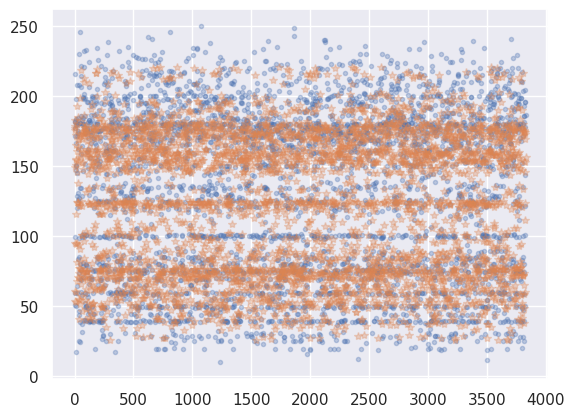

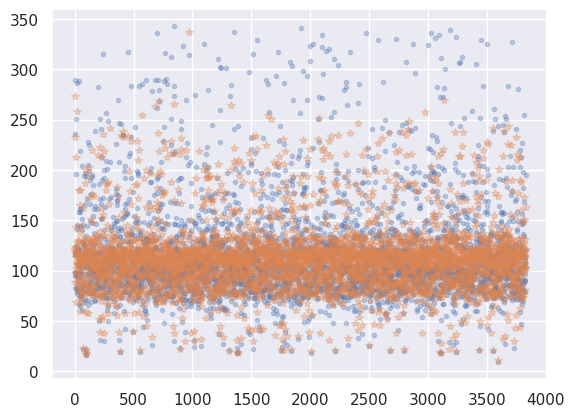

In [ ]:
plt.plot(PEF_test.values[idx,0],'.', alpha = 0.3)
plt.plot(ROP_value,'*', alpha = 0.3)
plt.show()
plt.plot(PEF_test.values[idx,1],'.', alpha = 0.3)
plt.plot(MSE_value,'*', alpha = 0.3)
# plt.ylim([-100,2000])
plt.show()

In [ ]:
sum(MSE_value > 1500) ## making sure there are no extreme values

0

In [ ]:
sum(ROP_value < 8)

0

It seems like the batch normalization (mean 0 std 1) forced the ROP too small so that MSE was too large. So we will not use it inbetween layers.

## Some Plots

In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

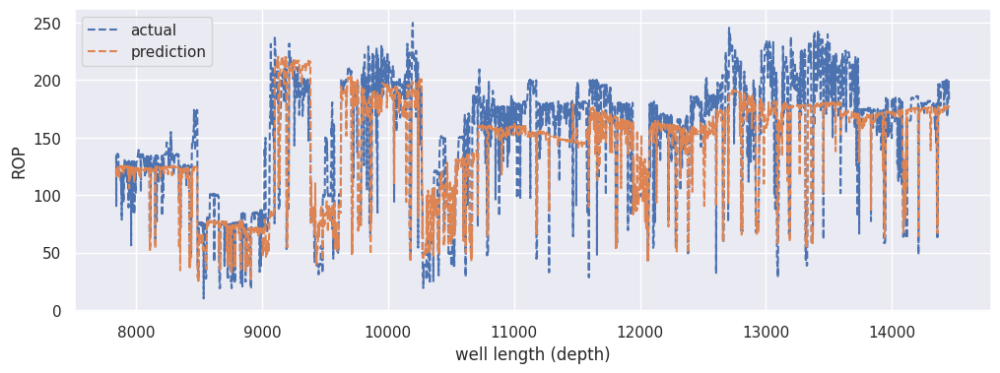

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[idx,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], ROP_value[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()

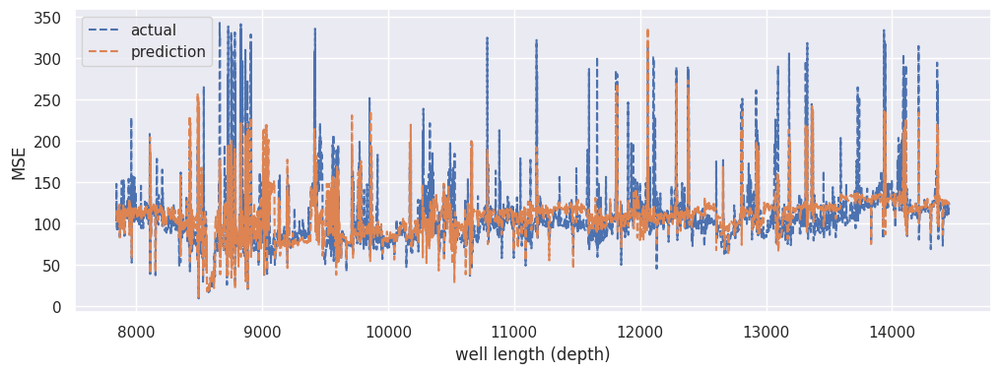

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[idx,1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], MSE_value[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

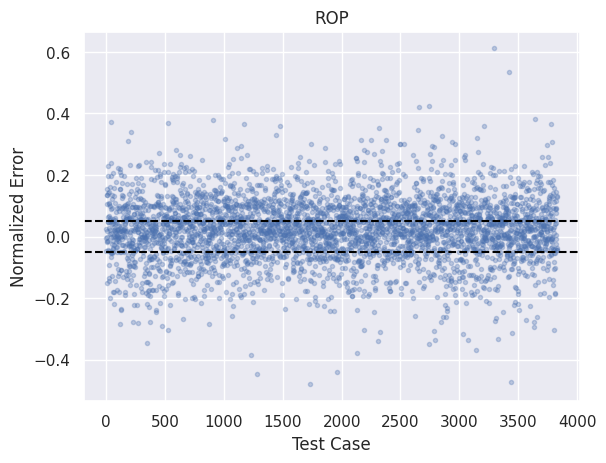

In [ ]:
plt.plot((PEF_test.values[idx,0]- ROP_value) / (np.max(PEF_test.values[idx,0]) - np.min(PEF_test.values[idx,0])), '.', alpha = 0.3 )
plt.axline((0, 0.05), slope=0, linestyle = '--', color = 'black')
plt.axline((0, -0.05), slope=0, linestyle = '--', color = 'black')
plt.xlabel('Test Case')
plt.ylabel('Normalized Error')
plt.title('ROP')
# plt.legend()
plt.show()
None

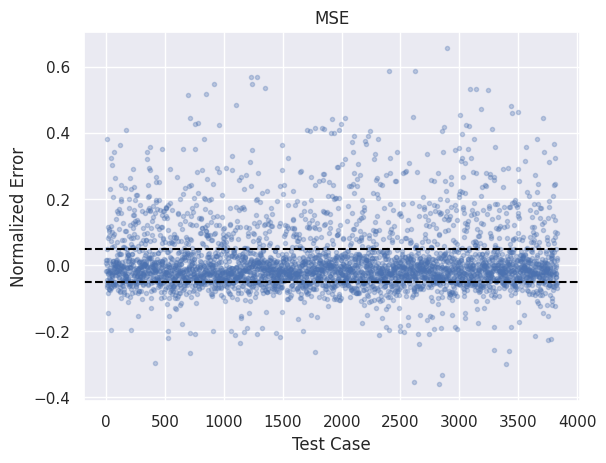

In [ ]:
plt.plot((PEF_test.values[idx,1]- MSE_value) / (np.max(PEF_test.values[idx,1]) - np.min(PEF_test.values[idx,1])), '.', alpha = 0.3 )
plt.axline((0, 0.05), slope=0, linestyle = '--', color = 'black')
plt.axline((0, -0.05), slope=0, linestyle = '--', color = 'black')
plt.xlabel('Test Case')
plt.ylabel('Normalized Error')
plt.title('MSE')
# plt.legend()
plt.show()
None

## for stacking method


In [ ]:
y_train1 = model.predict(X_train)

479/479 [==============================] - 1s 2ms/step


In [ ]:
y_pred1 = model.predict(X_test)

120/120 [==============================] - 0s 2ms/step


In [ ]:
# ROP =
def ROP(DOC, RPM, Flow):
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  RPMM = K * Flow;
  return DOC*(RPM+ RPMM) * 5 ## converting inch/min to ft/hr

In [ ]:
# MSE =
def MSE(ROP, Torque, WOB, RPM, Flow, dp):
  A_B = np.pi * (8.5/2)**2; ## np.pi * rad^2 , diameter of the bit is 8.5“ (inches)
  T_max = 15.02;# ft-kilo lb #2.074; # meter-ton
  dp_max = 700; # psi   # 49.2; # kg/cm**2
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  TM = T_max * dp / dp_max;
  RPMM = K * Flow;
  return (WOB*ROP+ 60*2*np.pi *RPM*Torque + 60*2*np.pi*RPMM*TM) / (A_B*ROP)

In [ ]:
ROP_value_train = ROP(y_train1[:,-1], X_train[:,2], X_train[:,3])
MSE_value_train = MSE(ROP_value_train, y_train1[:,0], X_train[:,1], X_train[:,2], X_train[:,3], dp_train[:])
# print(f'loss: {loss_fct(PEF_test.values[idx,0], ROP_value)}, Nloss: {loss_fct(PEF_test.values[idx,0], ROP_value) / (np.max(PEF_test.values[idx,0]) - np.min(PEF_test.values[idx,0]) )}') ## ROP error
# print(f'loss: {loss_fct(PEF_test.values[idx,1], MSE_value)}, Nloss: {loss_fct(PEF_test.values[idx,1], MSE_value) / (np.max(PEF_test.values[idx,1]) - np.min(PEF_test.values[idx,1]) )}') ## MSE

In [ ]:
ROP_value_test = ROP(y_pred1[:,-1], X_test[:,2], X_test[:,3])
MSE_value_test = MSE(ROP_value_test, y_pred1[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
# print(f'loss: {loss_fct(PEF_test.values[idx,0], ROP_value)}, Nloss: {loss_fct(PEF_test.values[idx,0], ROP_value) / (np.max(PEF_test.values[idx,0]) - np.min(PEF_test.values[idx,0]) )}') ## ROP error
# print(f'loss: {loss_fct(PEF_test.values[idx,1], MSE_value)}, Nloss: {loss_fct(PEF_test.values[idx,1], MSE_value) / (np.max(PEF_test.values[idx,1]) - np.min(PEF_test.values[idx,1]) )}') ## MSE

In [ ]:
y_train1 = np.concatenate((ROP_value_train.reshape(-1,1), MSE_value_train.reshape(-1,1)), axis = 1)
y_pred1 = np.concatenate((ROP_value_test.reshape(-1,1), MSE_value_test.reshape(-1,1)), axis = 1)

# PEF

In [ ]:
# y_train = IMP_train.values
# y_test = IMP_test.values
y_train = PEF_train.values
y_test = PEF_test.values

In [ ]:
if len(y_train.shape) ==1:
  y_train = y_train.reshape(-1,1)
  y_test = y_test.reshape(-1,1)

## Model

In [ ]:
def build_model(hp):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_train.shape[1])
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)


  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
# opt = keras.optimizers.Adam(learning_rate=0.001) ## 0.001 works well, had issues with 0.0001
# # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
# #     initial_learning_rate=1e-3,
# #     decay_steps=1000,
# #     decay_rate=0.8)

# model.compile(
#     # optimizer='adam',
#     optimizer = opt,
#     loss='mean_squared_error',
#     metrics=['mean_squared_error'],
# )

In [ ]:
# tuner = keras_tuner.BayesianOptimization(
#     hypermodel= build_model,
#     objective='val_mean_squared_error',
#     max_trials=20,
#     seed = SEED,
#     # if True, overwrite above directory if search is run again - i.e. don't resume
#     overwrite = True)
# tuner.search_space_summary()

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
    min_delta=0.001,
    start_from_epoch = 30,
    restore_best_weights=True,
)

In [ ]:
# tuner.search(X_train, y_train, validation_split=0.2, callbacks=[early_stopping])

In [ ]:
# # Get the top  models.
# models = tuner.get_best_models(num_models=5)
# # for model in models:
# #     model.build(input_shape = [None, X_train_full.shape[1]])
# #     model.summary()
# best_model = models[0]
# # Build the model.
# # Needed for `Sequential` without specified `input_shape`.
# # input_shape = [None, X_train_full.shape[1]]
# best_model.build(input_shape = [None, X_train.shape[1]])
# best_model.summary()

In [ ]:
# tuner.results_summary()

In [ ]:
# # Get the top 5 hyperparameters.
# best_hps = tuner.get_best_hyperparameters(5)
# # Build the model with the best hp.
# model = build_model(best_hps[0])
# # Fit with the entire dataset.
# # model.fit(X_train_full, y_train_full, epochs=1)
# # tensorboard_callback = keras.callbacks.TensorBoard(histogram_freq=1)
# history = model.fit(
#     X_train, y_train,
# #     validation_data=(X_valid, y_valid),
#     validation_split = 0.2,
#     batch_size=128,
#     epochs=1000,
#     callbacks=[early_stopping]#, tensorboard_callback],
# )

In [ ]:
model = build_model(1)

## Fitting

In [ ]:
tic = perf_counter()
history = model.fit(
    X_train, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 3s 6ms/step - loss: 47.2654 - root_mean_squared_error: 68.8538 - val_loss: 28.4055 - val_root_mean_squared_error: 39.5560
Epoch 2/200
384/384 [==============================] - 2s 4ms/step - loss: 23.9397 - root_mean_squared_error: 36.2174 - val_loss: 22.2099 - val_root_mean_squared_error: 34.6817
Epoch 3/200
384/384 [==============================] - 2s 5ms/step - loss: 22.0325 - root_mean_squared_error: 34.4937 - val_loss: 21.1915 - val_root_mean_squared_error: 33.7641
Epoch 4/200
384/384 [==============================] - 2s 6ms/step - loss: 21.5485 - root_mean_squared_error: 33.9988 - val_loss: 20.7813 - val_root_mean_squared_error: 33.2473
Epoch 5/200
384/384 [==============================] - 3s 7ms/step - loss: 21.1811 - root_mean_squared_error: 33.5971 - val_loss: 20.7204 - val_root_mean_squared_error: 32.8354
Epoch 6/200
384/384 [==============================] - 2s 5ms/step - loss: 20.8519 - root_mean_squared_error: 33.14

In [ ]:
# history.history

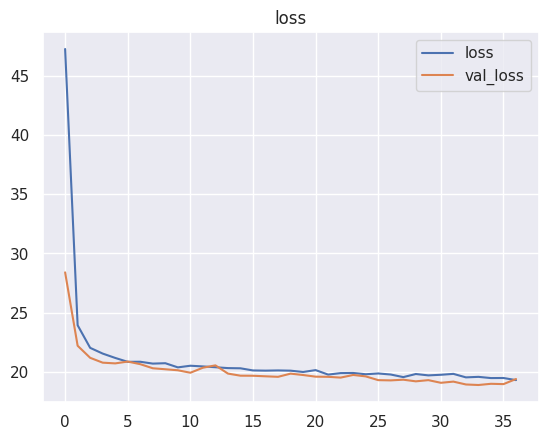

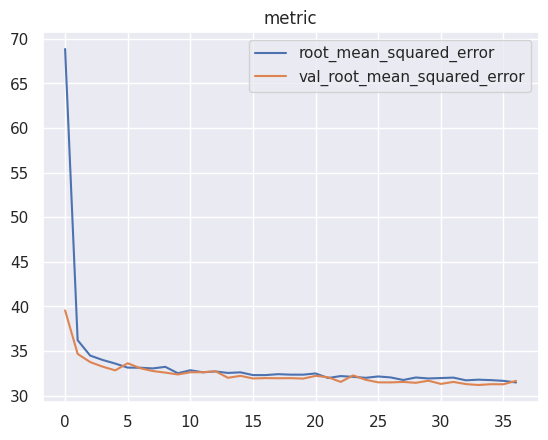

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[:, [0, 2]].plot(title="loss")
history_df.iloc[:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
start = history_df.shape[0] // 4

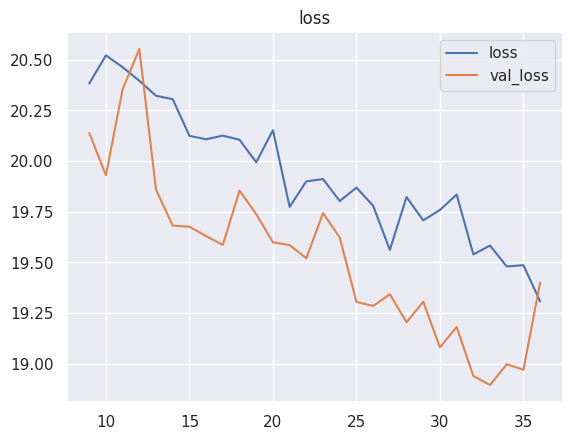

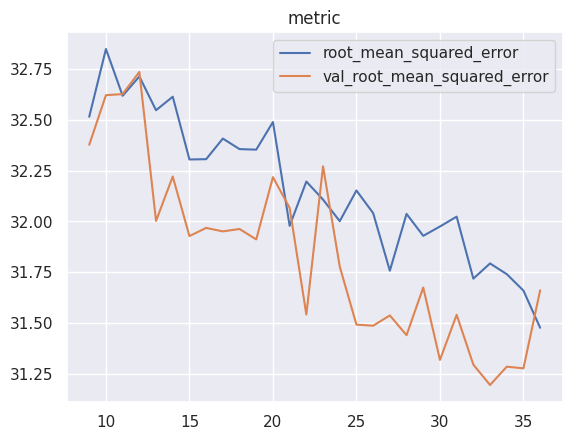

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[start:, [0, 2]].plot(title="loss")
history_df.iloc[start:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
y_pred = model.predict(X_test)

120/120 [==============================] - 0s 2ms/step


In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 4)]               0         
                                                                 
 batch_normalization_1 (Batc  (None, 4)                16        
 hNormalization)                                                 
                                                                 
 dense_3 (Dense)             (None, 256)               1280      
                                                                 
 dense_4 (Dense)             (None, 256)               65792     
                                                                 
 dense_5 (Dense)             (None, 2)                 514       
                                                                 
Total params: 67,602
Trainable params: 67,594
Non-trainable params: 8
_______________________________________________________

In [ ]:
# y_test.shape

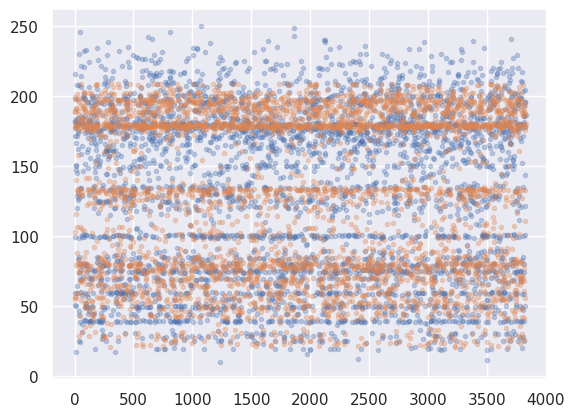

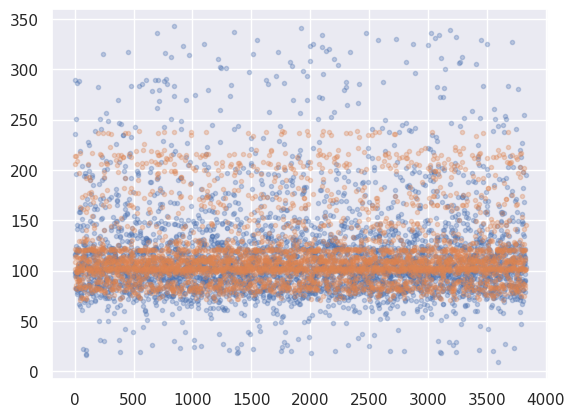

In [ ]:
for i in range(y_test.shape[1]):
  plt.plot(y_test[:,i],'.', alpha = 0.3)
  plt.plot(y_pred[:,i],'.', alpha = 0.3)
  # plt.ylim([0,250])
  plt.show()

## Final Targets

In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
for i in range(y_test.shape[1]):
  print(f'loss: {loss_fct(y_test[:,i], y_pred[:,i])}, Nloss: {loss_fct(y_test[:,i], y_pred[:,i]) / (np.max(y_test[:,i]) - np.min(y_test[:,i]) ) }')

loss: 23.720922470092773, Nloss: 0.0988796129822731
loss: 28.41193389892578, Nloss: 0.0913454070687294


In [ ]:
for j in range(y_test.shape[1]):
  err_i = 2 * abs(y_test[:,j] - y_pred[:,j]) / (y_test[:,j] + y_pred[:,j])
  err =  sum(err_i) / len(err_i)         ## err_i* 0.32 / (len(err_i)*0.32)   ## weighted sum using the avg weight ... the weights cancel
  print(f'err = {err}')                 ## by using avg weight we turn the weighted avg into just an avg

err = 0.1495394942347871
err = 0.18354292916358594


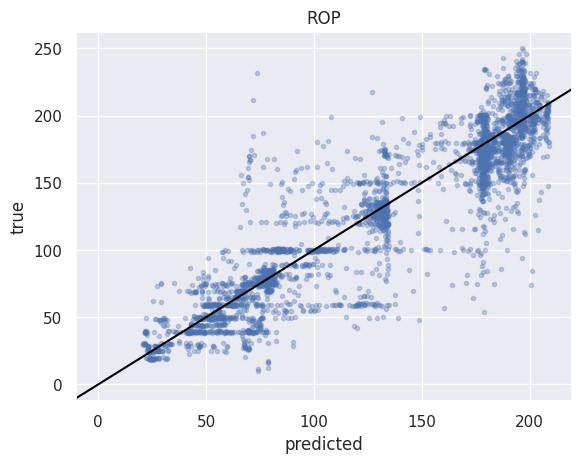

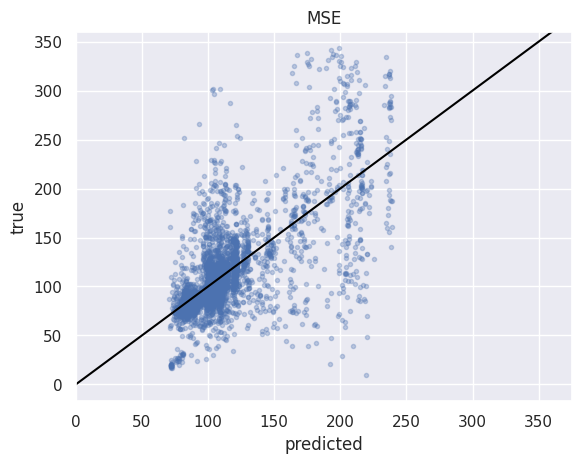

In [ ]:
plt.plot(y_pred[:,0], y_test[:,0], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('ROP')
plt.xlabel('predicted')
plt.ylabel('true')
plt.show()
plt.plot(y_pred[:,-1], y_test[:,-1], '.', alpha = 0.3)
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.title('MSE')
plt.xlabel('predicted')
plt.ylabel('true')
plt.xlim([0, 375])
plt.show()

In [ ]:
print(f'r2 score {r2_score(y_test[:,0], y_pred[:,0])}')
print(f'r2 score {r2_score(y_test[:,-1], y_pred[:,-1])}')

r2 score 0.8414949220132812
r2 score 0.44330961275798453


## Some Plots

In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

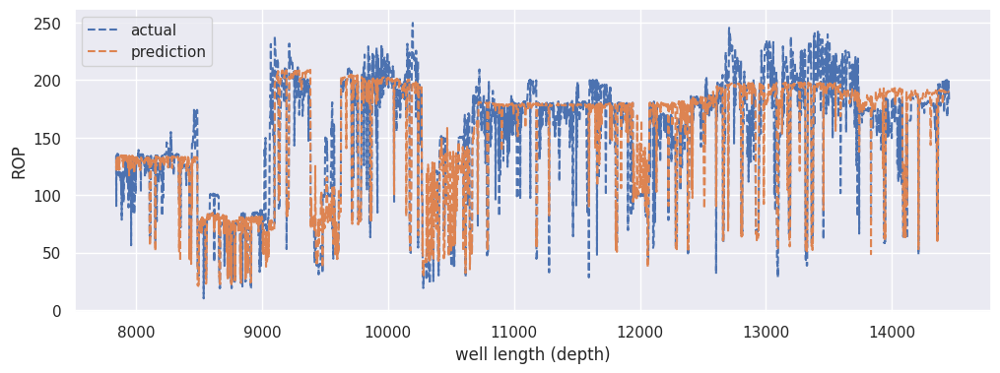

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,0][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()

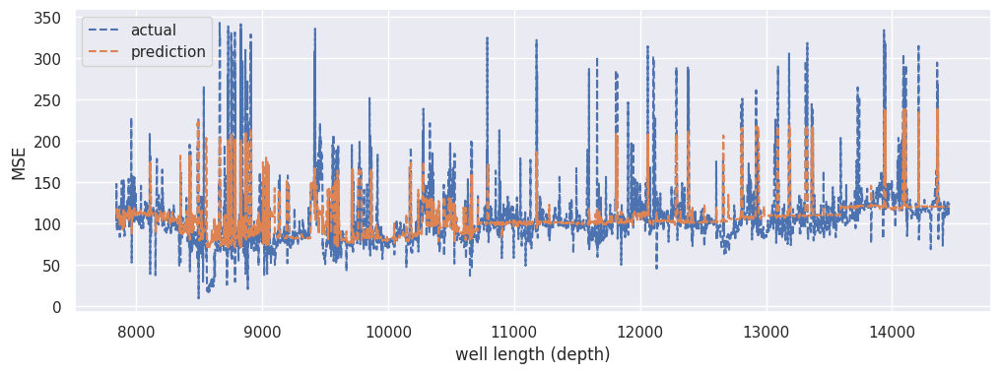

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,-1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,-1][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

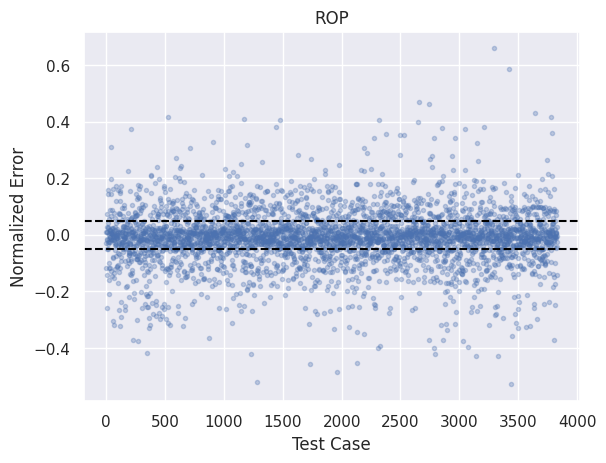

In [ ]:
plt.plot((y_test[:,0]- y_pred[:,0]) / (np.max(y_test[:,0]) - np.min(y_test[:,0])), '.', alpha = 0.3 )
plt.axline((0, 0.05), slope=0, linestyle = '--', color = 'black')
plt.axline((0, -0.05), slope=0, linestyle = '--', color = 'black')
plt.xlabel('Test Case')
plt.ylabel('Normalized Error')
plt.title('ROP')
# plt.legend()
plt.show()
None

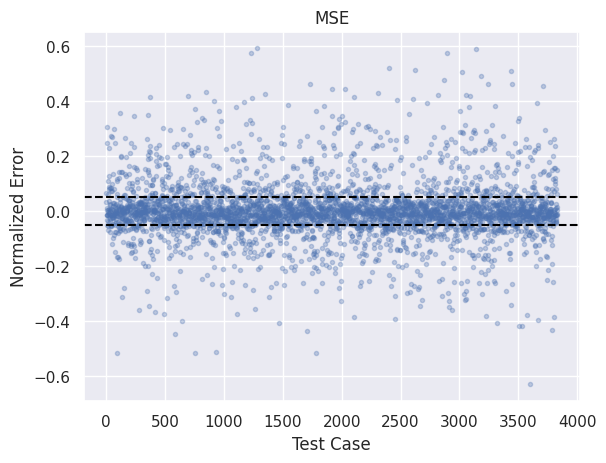

In [ ]:
plt.plot((y_test[:,-1]- y_pred[:,-1]) / (np.max(y_test[:,-1]) - np.min(y_test[:,-1])), '.', alpha = 0.3 )
plt.axline((0, 0.05), slope=0, linestyle = '--', color = 'black')
plt.axline((0, -0.05), slope=0, linestyle = '--', color = 'black')
plt.xlabel('Test Case')
plt.ylabel('Normalized Error')
plt.title('MSE')
# plt.legend()
plt.show()
None

## for stacking method


In [ ]:
y_train2 = model.predict(X_train)

479/479 [==============================] - 1s 2ms/step


In [ ]:
y_pred2 = model.predict(X_test)

120/120 [==============================] - 0s 2ms/step


# Plots with both PEF and IMP

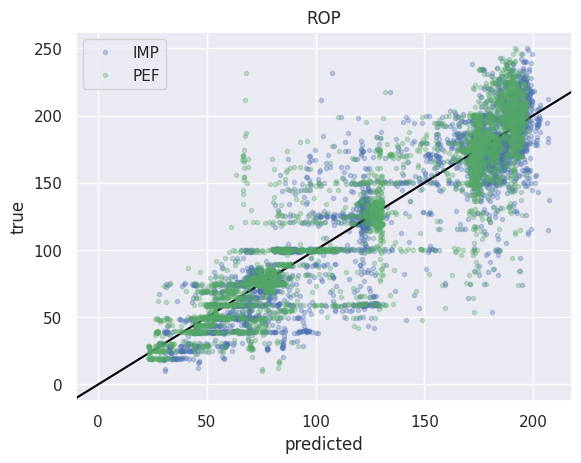

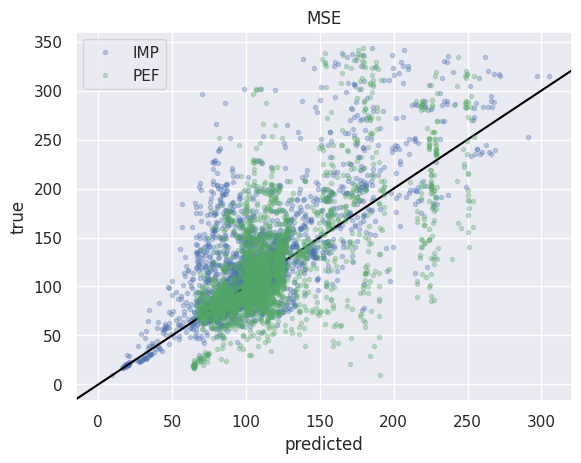

In [ ]:
plt.plot(ROP_value, PEF_test.values[idx,0], 'b.', alpha = 0.3, label = 'IMP')
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.plot(y_pred[:,0], y_test[:,0], 'g.', alpha = 0.3, label = 'PEF')
plt.title('ROP')
plt.xlabel('predicted')
plt.ylabel('true')
plt.legend()
plt.show()
plt.plot(MSE_value, PEF_test.values[idx,1], 'b.', alpha = 0.3, label = 'IMP')
plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
plt.plot(y_pred[:,-1], y_test[:,-1], 'g.', alpha = 0.3, label = 'PEF')
plt.title('MSE')
plt.xlabel('predicted')
plt.ylabel('true')
plt.legend()
plt.show()

In [ ]:
# plt.plot(y_pred[:,0], y_test[:,0], 'o', alpha = 0.3)
# plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
# plt.title('ROP')
# plt.xlabel('predicted')
# plt.ylabel('true')
# plt.show()
# plt.plot(y_pred[:,-1], y_test[:,-1], 'o', alpha = 0.3)
# plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
# plt.title('MSE')
# plt.xlabel('predicted')
# plt.ylabel('true')
# # plt.xlim([0, 350])
# plt.show()

In [ ]:
# PEF_test

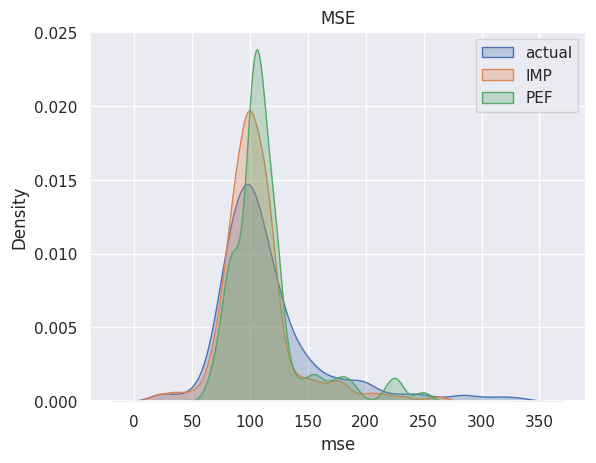

In [ ]:
sns.kdeplot(data = PEF_test, x = 'mse', label = 'actual', fill = True, alpha = 0.3)
sns.kdeplot(MSE_value, label = 'IMP', fill = True, alpha = 0.3)
sns.kdeplot(y_pred[:,-1], label = 'PEF', fill = True, alpha = 0.3)
plt.title('MSE')
plt.legend()
plt.show()
None

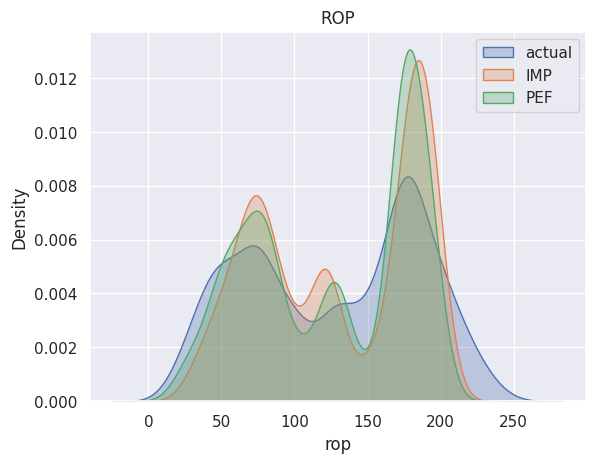

In [ ]:
sns.kdeplot(data = PEF_test, x = 'p', label = 'actual', fill = True, alpha = 0.3)
sns.kdeplot(ROP_value, label = 'IMP', fill = True, alpha = 0.3)
sns.kdeplot(y_pred[:,0], label = 'PEF', fill = True, alpha = 0.3)
plt.title('ROP')
plt.xlabel('rop')
plt.legend()
plt.show()
None

# Stacking IMP and PEF models

Here we will use an ensemble method (stacking) to combine the IMP and PEF models.

In [ ]:
def aggregate(y1, y2):
    X = None
    if y1 is None:
        X = y2
    if y2 is None:
        X = y1
    if X is None:
        X = np.concatenate((y1,y2), axis = 1)
    return X

In [ ]:
X_train_layer2 = aggregate(y_train1, y_train2) ## models prediction from training set (new X_train)

In [ ]:
X_test_layer2 = aggregate(y_pred1, y_pred2) ## models prediction from test set (new X_test)

In [ ]:
# y_train = IMP_train.values
# y_test = IMP_test.values
y_train = PEF_train.values
y_test = PEF_test.values

In [ ]:
# if len(y_train.shape) ==1:
#   y_train = y_train.reshape(-1,1)
#   y_test = y_test.reshape(-1,1)

In [ ]:
def build_model(hp):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_train_layer2.shape[1])   ###stacking input
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)


  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
    min_delta=0.001,
    start_from_epoch = 30,
    restore_best_weights=True,
)

In [ ]:
model = build_model(1)

In [ ]:
tic = perf_counter()
history = model.fit(
    X_train_layer2, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 4s 6ms/step - loss: 51.8110 - root_mean_squared_error: 73.9449 - val_loss: 19.1003 - val_root_mean_squared_error: 29.4716
Epoch 2/200
384/384 [==============================] - 3s 8ms/step - loss: 19.4117 - root_mean_squared_error: 29.2283 - val_loss: 17.8700 - val_root_mean_squared_error: 28.0785
Epoch 3/200
384/384 [==============================] - 2s 6ms/step - loss: 18.6250 - root_mean_squared_error: 28.4985 - val_loss: 17.9078 - val_root_mean_squared_error: 28.5256
Epoch 4/200
384/384 [==============================] - 2s 5ms/step - loss: 18.4686 - root_mean_squared_error: 28.3606 - val_loss: 17.7213 - val_root_mean_squared_error: 27.9630
Epoch 5/200
384/384 [==============================] - 2s 5ms/step - loss: 17.9320 - root_mean_squared_error: 27.8677 - val_loss: 17.1099 - val_root_mean_squared_error: 27.8005
Epoch 6/200
384/384 [==============================] - 2s 5ms/step - loss: 17.9653 - root_mean_squared_error: 27.91

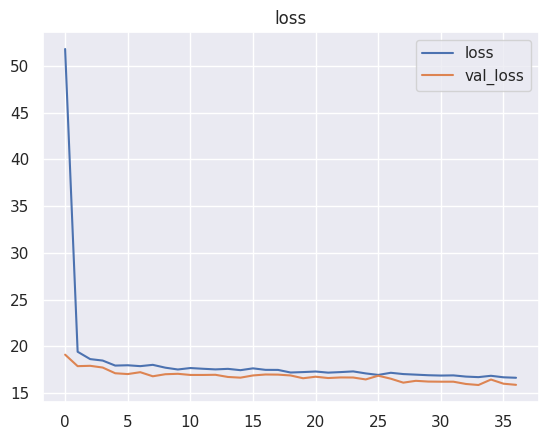

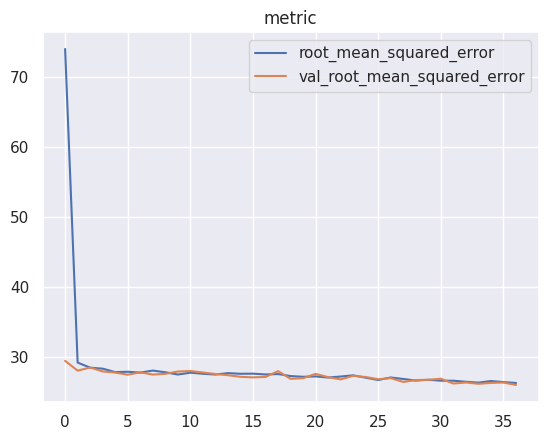

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[:, [0, 2]].plot(title="loss")
history_df.iloc[:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
start = history_df.shape[0] // 4

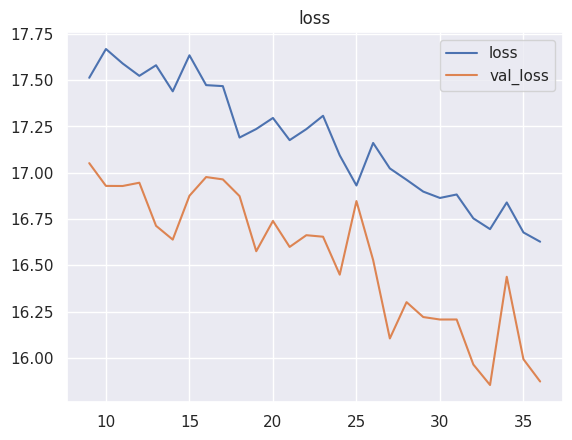

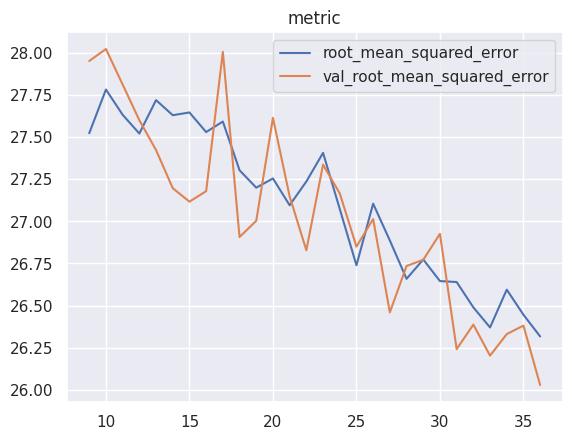

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.iloc[start:, [0, 2]].plot(title="loss")
history_df.iloc[start:, [1,3]].plot(title="metric")
# history_df.iloc[:, [0].plot(title="loss")
# history_df.iloc[:, [1]].plot(title="metric")
None

In [ ]:
y_pred = model.predict(X_test_layer2)

120/120 [==============================] - 0s 2ms/step


In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
for i in range(y_test.shape[1]):
  print(f'loss: {loss_fct(y_test[:,i], y_pred[:,i])}, Nloss: {loss_fct(y_test[:,i], y_pred[:,i]) / (np.max(y_test[:,i]) - np.min(y_test[:,i]) ) }')

loss: 21.581523895263672, Nloss: 0.08996162563562393
loss: 24.204666137695312, Nloss: 0.07614597678184509


In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

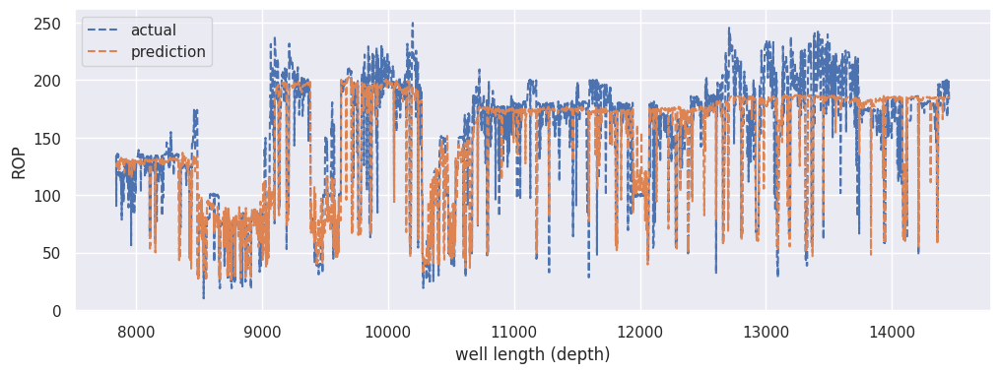

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,0][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()

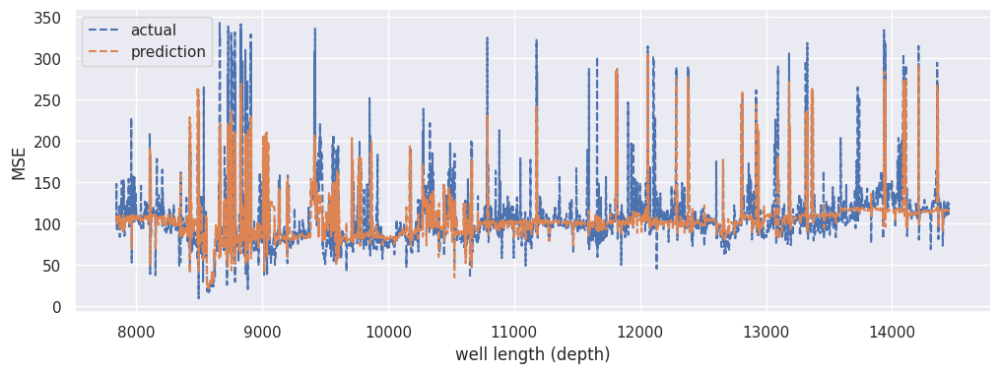

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,-1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,-1][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

# Stacking multiple IMP models

## Stacking multiple IMP models 1

We convert the intermediate features in to the final features before feeding it in to the meta-learner.

In [ ]:
y_train = IMP_train.values[:,[0,2]]
y_test = IMP_test.values[:,[0,2]]
# y_train = PEF_train.values
# y_test = PEF_test.values

In [ ]:
def build_model_layer1(units = 256, hidden_layers = 2):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  # units = units
  input = keras.layers.Input(shape=X_train.shape[1])
  BN0 = layers.BatchNormalization()(input)
  layer_names = [BN0, 'HL1', 'HL2', 'HL3', 'HL4']
  for layer in range(1,hidden_layers+1):
    layer_names[layer] = layers.Dense(units, activation = activation,
                                      kernel_initializer = initializer)(layer_names[layer - 1])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(layer_names[layer])
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
def aggregate(y1, y2):
    X = None
    if y1 is None:
        X = y2
    if y2 is None:
        X = y1
    if X is None:
        X = np.concatenate((y1,y2), axis = 1)
    return X

In [ ]:
def prepare_layer2(num_of_models = 3):
    all_models = [0]*num_of_models
    X_layer2 = None
    for i in range(num_of_models):
        model = build_model_layer1(units = rnd.randrange(64, 256+32, 32), hidden_layers = rnd.randrange(2, 5, 1))

        history = model.fit(
            X_train, y_train,
        #     validation_data=(X_val, y_val),
            validation_split = 0.2,
            batch_size=32,
            epochs=200,
            callbacks=[early_stopping]#, tensorboard_callback],
        )
        all_models[i] = model
        y_train1 = model.predict(X_train)
        ROP_value_train = ROP(y_train1[:,-1], X_train[:,2], X_train[:,3])
        MSE_value_train = MSE(ROP_value_train, y_train1[:,0], X_train[:,1],
                              X_train[:,2], X_train[:,3], dp_train[:])
        y_train1 = np.concatenate((ROP_value_train.reshape(-1,1), MSE_value_train.reshape(-1,1)), axis = 1)
        X_layer2 = aggregate(X_layer2, y_train1)
    return X_layer2, all_models


In [ ]:
X_layer2, all_models = prepare_layer2()

Epoch 1/200
384/384 [==============================] - 3s 5ms/step - loss: 0.4646 - root_mean_squared_error: 1.4955 - val_loss: 0.2687 - val_root_mean_squared_error: 0.8898
Epoch 2/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2896 - root_mean_squared_error: 0.9349 - val_loss: 0.2436 - val_root_mean_squared_error: 0.8236
Epoch 3/200
384/384 [==============================] - 2s 6ms/step - loss: 0.2729 - root_mean_squared_error: 0.9112 - val_loss: 0.2350 - val_root_mean_squared_error: 0.8450
Epoch 4/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2714 - root_mean_squared_error: 0.9079 - val_loss: 0.2501 - val_root_mean_squared_error: 0.8472
Epoch 5/200
384/384 [==============================] - 2s 4ms/step - loss: 0.2686 - root_mean_squared_error: 0.8971 - val_loss: 0.2182 - val_root_mean_squared_error: 0.7922
Epoch 6/200
384/384 [==============================] - 2s 4ms/step - loss: 0.2564 - root_mean_squared_error: 0.8825 - val_loss: 0.2566 

In [ ]:
# y_train = IMP_train.values
# y_test = IMP_test.values
y_train = PEF_train.values
y_test = PEF_test.values

In [ ]:
def build_model(hp):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_layer2.shape[1])
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)



  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
model = build_model(1)

In [ ]:
tic = perf_counter()
history = model.fit(
    X_layer2, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 3s 5ms/step - loss: 48.5570 - root_mean_squared_error: 74.0261 - val_loss: 19.9975 - val_root_mean_squared_error: 30.3936
Epoch 2/200
384/384 [==============================] - 3s 7ms/step - loss: 20.0654 - root_mean_squared_error: 30.1723 - val_loss: 18.5539 - val_root_mean_squared_error: 29.4338
Epoch 3/200
384/384 [==============================] - 3s 7ms/step - loss: 18.9115 - root_mean_squared_error: 29.1269 - val_loss: 17.6687 - val_root_mean_squared_error: 28.0755
Epoch 4/200
384/384 [==============================] - 2s 4ms/step - loss: 18.5168 - root_mean_squared_error: 28.6771 - val_loss: 17.6921 - val_root_mean_squared_error: 28.1414
Epoch 5/200
384/384 [==============================] - 2s 5ms/step - loss: 18.3603 - root_mean_squared_error: 28.5561 - val_loss: 17.7002 - val_root_mean_squared_error: 27.9307
Epoch 6/200
384/384 [==============================] - 2s 5ms/step - loss: 18.2934 - root_mean_squared_error: 28.43

In [ ]:
# def predict_test(X_test)
X_test_layer2 = None
for mod in all_models:
    y_pred1 = mod.predict(X_test)
    ROP_value_test = ROP(y_pred1[:,-1], X_test[:,2], X_test[:,3])
    MSE_value_test = MSE(ROP_value_test, y_pred1[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
    y_pred1 = np.concatenate((ROP_value_test.reshape(-1,1), MSE_value_test.reshape(-1,1)), axis = 1)
    X_test_layer2 = aggregate(X_test_layer2, y_pred1)

120/120 [==============================] - 0s 2ms/step


In [ ]:
y_pred = model.predict(X_test_layer2)

120/120 [==============================] - 0s 2ms/step


In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
for i in range(y_test.shape[1]):
  print(f'loss: {loss_fct(y_test[:,i], y_pred[:,i])}, Nloss: {loss_fct(y_test[:,i], y_pred[:,i]) / (np.max(y_test[:,i]) - np.min(y_test[:,i]) ) }')

loss: 21.93962860107422, Nloss: 0.09145436435937881
loss: 24.826448440551758, Nloss: 0.0783502534031868


In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

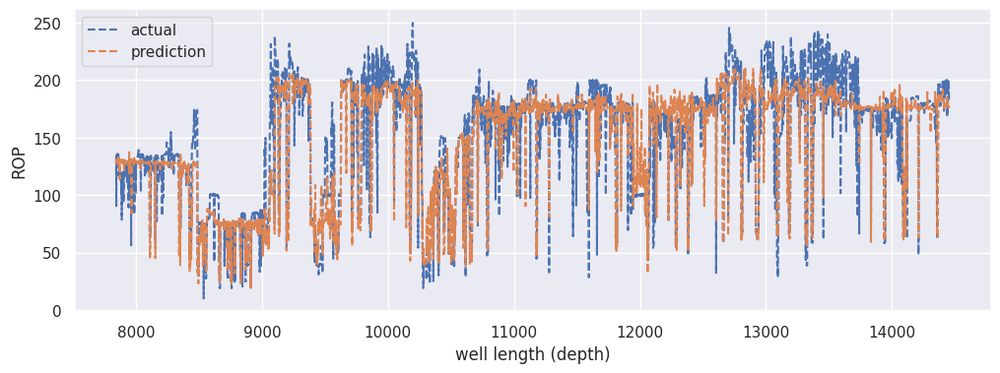

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,0][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()

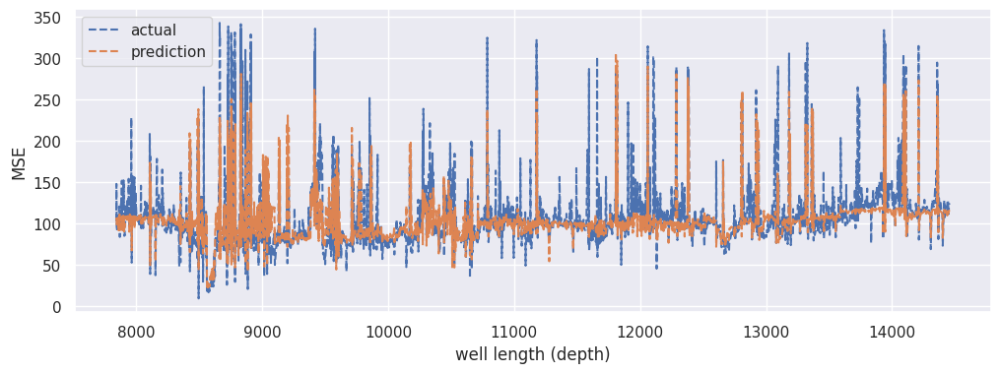

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], y_test[:,-1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], y_pred[:,-1][well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

## Stacking multiple IMP models 2

We convert the intermediate features in to the final features after feeding it in to the meta-learner.

In [ ]:
y_train = IMP_train.values[:,[0,2]]
y_test = IMP_test.values[:,[0,2]]
# y_train = PEF_train.values
# y_test = PEF_test.values

In [ ]:
def build_model_layer1(units = 256, hidden_layers = 2):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  # units = units
  input = keras.layers.Input(shape=X_train.shape[1])
  BN0 = layers.BatchNormalization()(input)
  layer_names = [BN0, 'HL1', 'HL2', 'HL3', 'HL4']
  for layer in range(1,hidden_layers+1):
    layer_names[layer] = layers.Dense(units, activation = activation,
                                      kernel_initializer = initializer)(layer_names[layer - 1])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(layer_names[layer])
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
def aggregate(y1, y2):
    X = None
    if y1 is None:
        X = y2
    if y2 is None:
        X = y1
    if X is None:
        X = np.concatenate((y1,y2), axis = 1)
    return X

In [ ]:
def prepare_layer2(num_of_models = 3):
    all_models = [0]*num_of_models
    X_layer2 = None
    for i in range(num_of_models):
        model = build_model_layer1(units = rnd.randrange(64, 256+32, 32), hidden_layers = rnd.randrange(2, 5, 1))

        history = model.fit(
            X_train, y_train,
        #     validation_data=(X_val, y_val),
            validation_split = 0.2,
            batch_size=32,
            epochs=200,
            callbacks=[early_stopping]#, tensorboard_callback],
        )
        all_models[i] = model
        y_train1 = model.predict(X_train)
        # ROP_value_train = ROP(y_train1[:,-1], X_train[:,2], X_train[:,3])
        # MSE_value_train = MSE(ROP_value_train, y_train1[:,0], X_train[:,1],
        #                       X_train[:,2], X_train[:,3], dp_train[:])
        # y_train1 = np.concatenate((ROP_value_train.reshape(-1,1), MSE_value_train.reshape(-1,1)), axis = 1)
        X_layer2 = aggregate(X_layer2, y_train1)
    return X_layer2, all_models


In [ ]:
X_layer2, all_models = prepare_layer2()

Epoch 1/200
384/384 [==============================] - 4s 4ms/step - loss: 0.5025 - root_mean_squared_error: 1.5838 - val_loss: 0.2423 - val_root_mean_squared_error: 0.8356
Epoch 2/200
384/384 [==============================] - 2s 6ms/step - loss: 0.2803 - root_mean_squared_error: 0.9291 - val_loss: 0.2551 - val_root_mean_squared_error: 0.8808
Epoch 3/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2851 - root_mean_squared_error: 0.9311 - val_loss: 0.2328 - val_root_mean_squared_error: 0.8389
Epoch 4/200
384/384 [==============================] - 1s 3ms/step - loss: 0.2691 - root_mean_squared_error: 0.9023 - val_loss: 0.2303 - val_root_mean_squared_error: 0.8279
Epoch 5/200
384/384 [==============================] - 1s 3ms/step - loss: 0.2576 - root_mean_squared_error: 0.8858 - val_loss: 0.2650 - val_root_mean_squared_error: 0.9000
Epoch 6/200
384/384 [==============================] - 1s 4ms/step - loss: 0.2613 - root_mean_squared_error: 0.8943 - val_loss: 0.2186 

In [ ]:
def build_model(hp):
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_layer2.shape[1])
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)



  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
model = build_model(1)

In [ ]:
tic = perf_counter()
history = model.fit(
    X_layer2, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 3s 5ms/step - loss: 0.6230 - root_mean_squared_error: 1.8174 - val_loss: 0.2727 - val_root_mean_squared_error: 0.8791
Epoch 2/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2962 - root_mean_squared_error: 0.9420 - val_loss: 0.2450 - val_root_mean_squared_error: 0.8184
Epoch 3/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2774 - root_mean_squared_error: 0.9082 - val_loss: 0.2342 - val_root_mean_squared_error: 0.8033
Epoch 4/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2787 - root_mean_squared_error: 0.9143 - val_loss: 0.2107 - val_root_mean_squared_error: 0.7853
Epoch 5/200
384/384 [==============================] - 3s 7ms/step - loss: 0.2661 - root_mean_squared_error: 0.8880 - val_loss: 0.2103 - val_root_mean_squared_error: 0.7799
Epoch 6/200
384/384 [==============================] - 3s 7ms/step - loss: 0.2618 - root_mean_squared_error: 0.8812 - val_loss: 0.3272 

In [ ]:
# def predict_test(X_test)
X_test_layer2 = None
for mod in all_models:
    y_pred1 = mod.predict(X_test)
    # ROP_value_test = ROP(y_pred1[:,-1], X_test[:,2], X_test[:,3])
    # MSE_value_test = MSE(ROP_value_test, y_pred1[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
    # y_pred1 = np.concatenate((ROP_value_test.reshape(-1,1), MSE_value_test.reshape(-1,1)), axis = 1)
    X_test_layer2 = aggregate(X_test_layer2, y_pred1)

120/120 [==============================] - 0s 3ms/step


In [ ]:
y_pred = model.predict(X_test_layer2)

120/120 [==============================] - 0s 2ms/step


In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
ROP_value = ROP(y_pred[:,-1], X_test[:,2], X_test[:,3])
MSE_value = MSE(ROP_value, y_pred[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
print(f'loss: {loss_fct(PEF_test.values[:,0], ROP_value)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_value) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
print(f'loss: {loss_fct(PEF_test.values[:,1], MSE_value)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_value) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE

loss: 26.0771541595459, Nloss: 0.10870146006345749
loss: 28.677045822143555, Nloss: 0.08956077694892883


In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

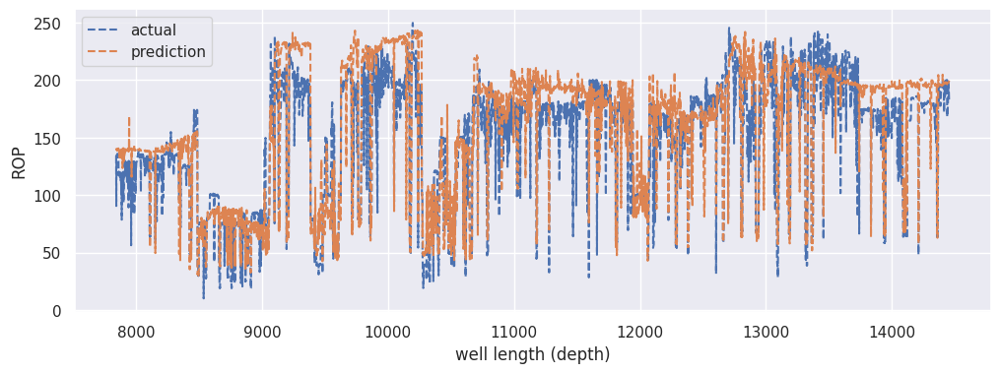

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], ROP_value[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()

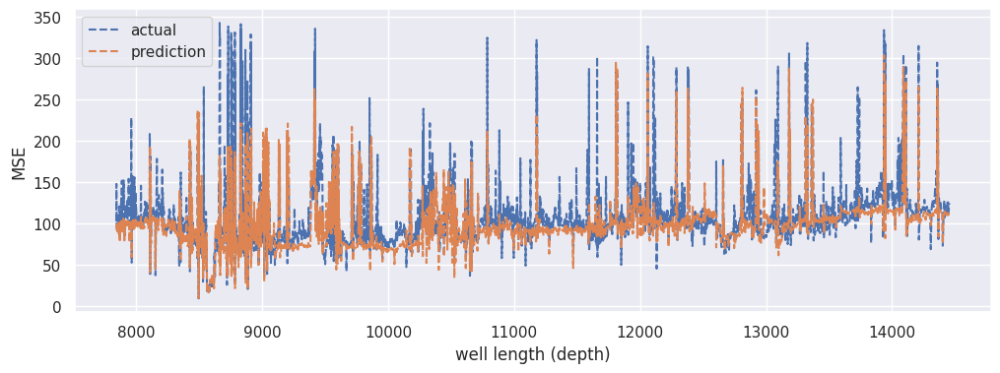

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], MSE_value[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

# ML algorithms (mostly Trees)

In [ ]:
y_train = IMP_train.values[:,[0,2]]
y_test = IMP_test.values[:,[0,2]]
# y_train = PEF_train.values
# y_test = PEF_test.values

In [ ]:
RF = RandomForestRegressor(random_state=SEED)

In [ ]:
# RF.fit(X_train, y_train)

In [ ]:
# RF.score(X_train, y_train)

In [ ]:
# y_pred_RF = RF.predict(X_test)

In [ ]:
RF_distribution = dict(max_depth= [3,6,9,12] , n_estimators = [100,250,500] )

In [ ]:
RF_clf = RandomizedSearchCV(RF, RF_distribution, random_state=SEED, n_iter=10, cv = 5)

In [ ]:
RF_clf.fit(X_train, y_train)

RandomizedSearchCV(estimator=RandomForestRegressor(random_state=0),
                   param_distributions={'max_depth': [3, 6, 9, 12],
                                        'n_estimators': [100, 250, 500]},
                   random_state=0)

In [ ]:
y_pred_RF = RF_clf.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
mean_squared_error(y_test, y_pred_RF, squared = False, multioutput = 'raw_values')

array([0.79943577, 0.01679811])

In [ ]:
loss_fct = keras.metrics.RootMeanSquaredError()

In [ ]:
# ROP =
def ROP(DOC, RPM, Flow):
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  RPMM = K * Flow;
  return DOC*(RPM+ RPMM) * 5 ## converting inch/min to ft/hr

In [ ]:
# MSE =
def MSE(ROP, Torque, WOB, RPM, Flow, dp):
  A_B = np.pi * (8.5/2)**2; ## np.pi * rad^2 , diameter of the bit is 8.5“ (inches)
  T_max = 15.02;# ft-kilo lb #2.074; # meter-ton
  dp_max = 700; # psi   # 49.2; # kg/cm**2
  K = 74 * (1/ 264.172); ## rev / m**3 * m**3 / gal = rev / gal
  TM = T_max * dp / dp_max;
  RPMM = K * Flow;
  return (WOB*ROP+ 60*2*np.pi *RPM*Torque + 60*2*np.pi*RPMM*TM) / (A_B*ROP)

In [ ]:
ROP_RF = ROP(y_pred_RF[:,-1], X_test[:,2], X_test[:,3])
MSE_RF = MSE(ROP_RF, y_pred_RF[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
print(f'loss: {loss_fct(PEF_test.values[:,0], ROP_RF)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_RF) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
print(f'loss: {loss_fct(PEF_test.values[:,1], MSE_RF)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_RF) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE

loss: 16.406227111816406, Nloss: 0.06838862597942352
loss: 18.15558433532715, Nloss: 0.05683587118983269


Doing multiple ML algorithms in a loop

In [ ]:
# help(xgb.XGBRegressor)

In [ ]:
estimators_stacking = [('rf', RandomForestRegressor(random_state=SEED)),
#  ('ada', AdaBoostRegressor(random_state=SEED)),
#  ('gb', HistGradientBoostingRegressor(random_state=SEED)),
  ('xgb', xgb.XGBRegressor(random_state=SEED)),
  ('et', ExtraTreesRegressor(random_state=SEED))]

In [ ]:
parameters = {'rf': {'n_estimators': [250,500], 'max_depth':[9,12,15]},
              # 'ada':{'n_estimators': [100,250,500], 'learning_rate': [1, 0.5, 0.1]},
              # 'gb':{'max_iter':[100, 150, 200], 'learning_rate': [1, 0.5, 0.1]},
              'xgb': {'max_depth':[9,12,15], 'learning_rate': [0.3, 0.1, 0.05] },
              'et' :{'n_estimators': [250,500,750], 'max_depth':[9,12,15]} }

In [ ]:
estimators_stacking_para = [0]*len(estimators_stacking)
for i, (name, clf) in enumerate(estimators_stacking):
  clf_search = RandomizedSearchCV(clf, parameters[name], cv = 5).fit(X_train, y_train)
  estimators_stacking_para[i] = (name, clf_search.best_estimator_)


In [ ]:
estimators_stacking_para

[('rf', RandomForestRegressor(max_depth=12, n_estimators=250, random_state=0)),
 ('xgb',
  XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.1, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=12, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=100, n_jobs=None, num_parallel_tree=None,
               predictor=None, random_state=0, ...)),
 ('et', ExtraTreesRegressor(max_depth=12, n_estimators=500, random_state=0))]

In [ ]:
estimators_stacking_para = [('rf', RandomForestRegressor(max_depth=12, n_estimators=250, random_state=0)),
 ('xgb',XGBRegressor(learning_rate=0.1, max_depth=12, n_estimators=100, random_state=0)),
 ('et', ExtraTreesRegressor(max_depth=12, n_estimators=500, random_state=0))]
for (name, clf) in estimators_stacking_para:
  clf.fit(X_train, y_train)

In [ ]:
well_length_test_idx = np.argsort(X_test[:,0])

rf loss: 17.63901138305664, Nloss: 0.07317233830690384
rf loss: 17.822200775146484, Nloss: 0.054091110825538635


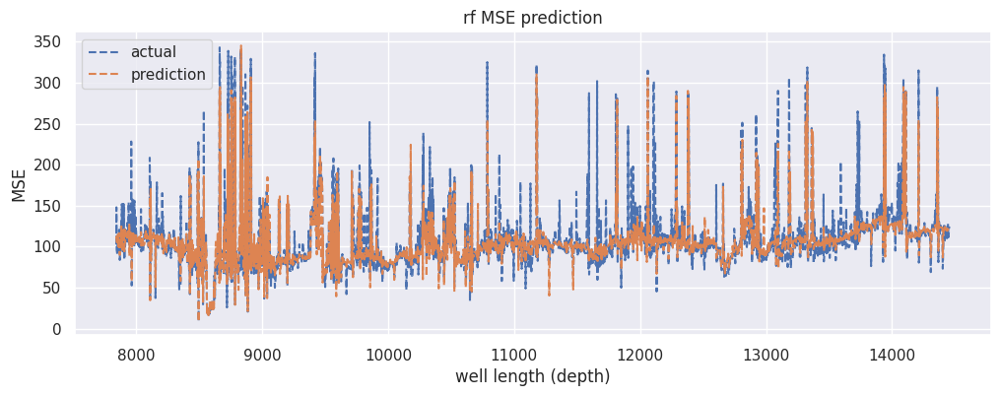

xgb loss: 17.777233123779297, Nloss: 0.07306375354528427
xgb loss: 17.438257217407227, Nloss: 0.05200444161891937


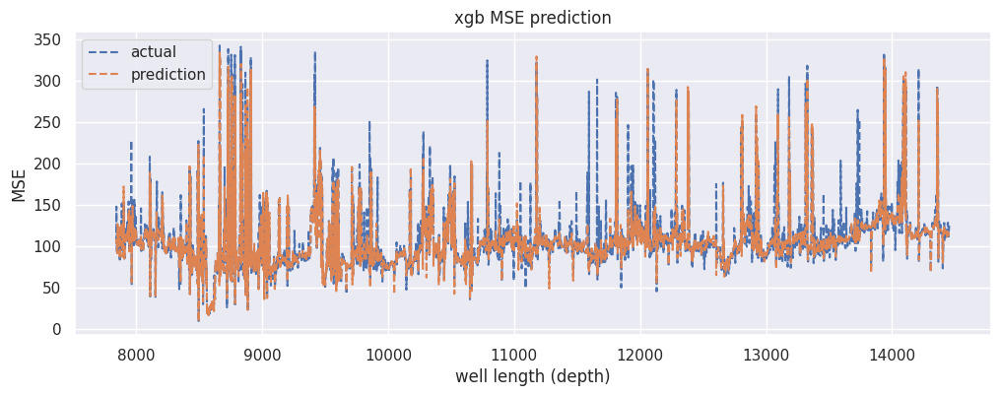

et loss: 17.312959671020508, Nloss: 0.07199987769126892
et loss: 17.51687240600586, Nloss: 0.05314469337463379


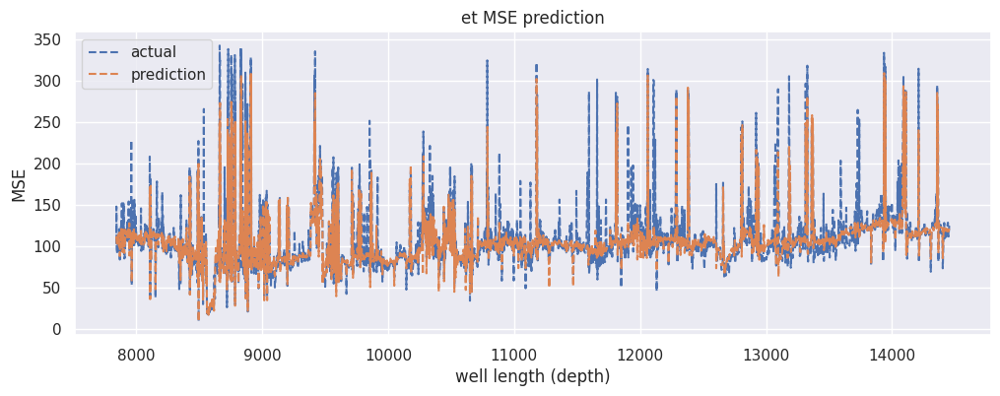

In [ ]:
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
  print(f'{name} loss: {loss_fct(PEF_test.values[:,0], ROP_clf)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_clf) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
  print(f'{name} loss: {loss_fct(PEF_test.values[:,1], MSE_clf)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_clf) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE
  plt.figure(figsize=(12,4))
  plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,1][well_length_test_idx],'--', label = 'actual')
  plt.plot(X_test[:,0][well_length_test_idx], MSE_clf[well_length_test_idx],'--', label = 'prediction')
  plt.xlabel('well length (depth)')
  plt.ylabel('MSE')
  plt.title(f'{name} MSE prediction')
  plt.legend()
  plt.show()

rf loss: 17.686534881591797, Nloss: 0.07352743297815323
rf loss: 17.784772872924805, Nloss: 0.053687550127506256


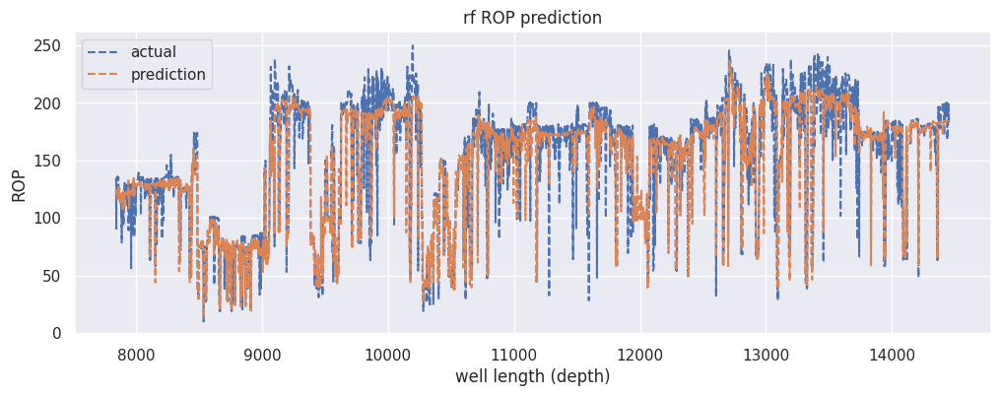

xgb loss: 17.760957717895508, Nloss: 0.07341531664133072
xgb loss: 17.55484390258789, Nloss: 0.05243493989109993


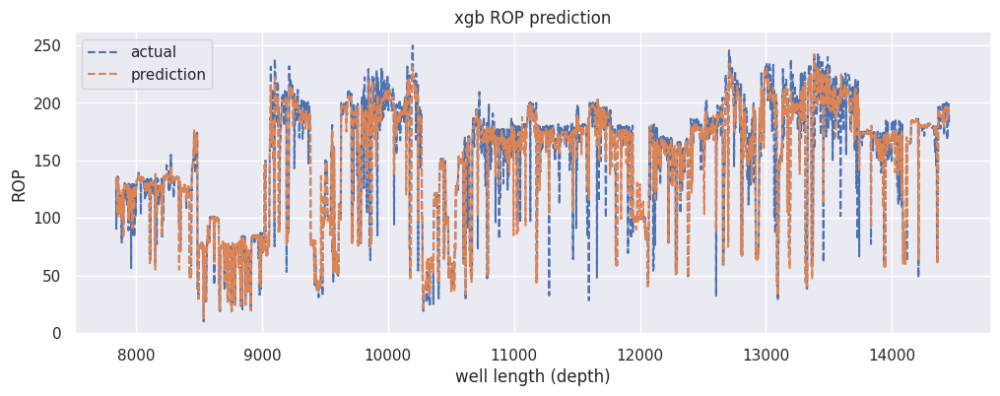

et loss: 17.468671798706055, Nloss: 0.07269037514925003
et loss: 17.592958450317383, Nloss: 0.05314469709992409


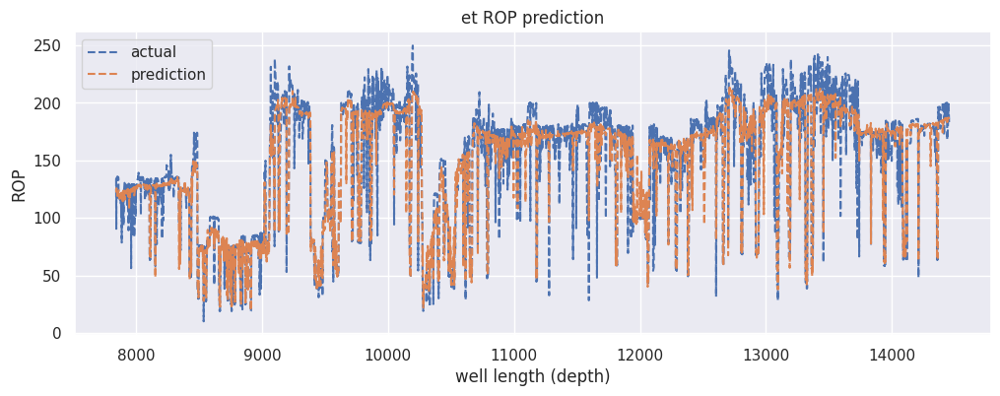

In [ ]:
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
  print(f'{name} loss: {loss_fct(PEF_test.values[:,0], ROP_clf)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_clf) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
  print(f'{name} loss: {loss_fct(PEF_test.values[:,1], MSE_clf)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_clf) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE
  plt.figure(figsize=(12,4))
  plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,0][well_length_test_idx],'--', label = 'actual')
  plt.plot(X_test[:,0][well_length_test_idx], ROP_clf[well_length_test_idx],'--', label = 'prediction')
  plt.xlabel('well length (depth)')
  plt.ylabel('ROP')
  plt.title(f'{name} ROP prediction')
  plt.legend()
  plt.show()

In [ ]:
from sklearn.inspection import permutation_importance

In [ ]:
feature_names = np.array(['well length', 'wob', 'rpm', 'flow'])

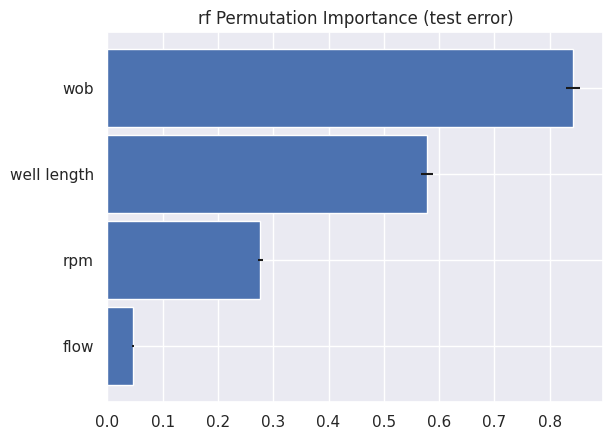

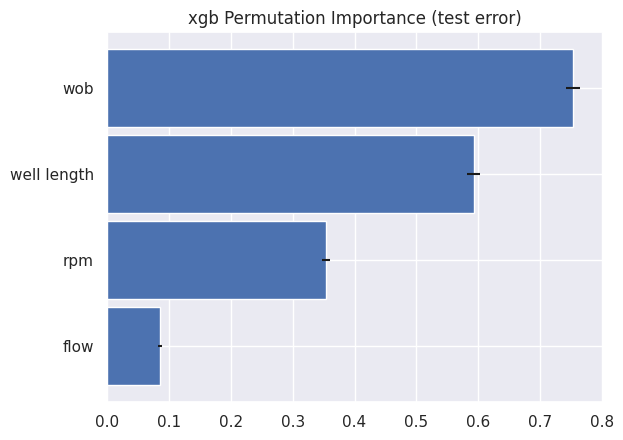

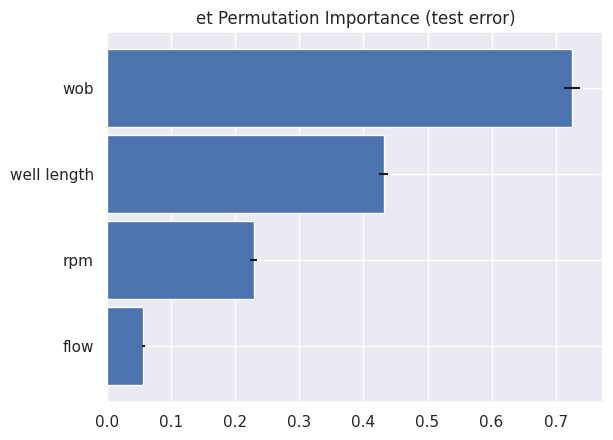

In [ ]:
for (name, clf) in estimators_stacking_para:
  importance_stacking = permutation_importance(estimator = clf, X = X_test, y = y_test,
                                             n_repeats = 20, random_state= SEED)
  sorted_idx = np.argsort(importance_stacking.importances_mean)
  plt.barh(y = np.linspace(0, 1,4) , width = importance_stacking.importances_mean[sorted_idx], height = 0.3,
         tick_label = feature_names[sorted_idx],
         xerr = importance_stacking.importances_std[sorted_idx])
  plt.title(f'{name} Permutation Importance (test error)')
  plt.show()

In [ ]:
# importance_stacking

In [ ]:
# plt.barh(ct.get_feature_names_out(), importance_stacking.importances_mean, xerr = importance_stacking.importances_std)
# # plt.xticks(rotation='vertical')
# None

In [ ]:
# sorted_idx = np.argsort(importance_stacking.importances_mean)

In [ ]:
# plt.barh(y = np.linspace(0, 1,4) , width = importance_stacking.importances_mean[sorted_idx], height = 0.3,
#          tick_label = feature_names[sorted_idx],
#          xerr = importance_stacking.importances_std[sorted_idx])
# plt.title('Permutation Importance (test error)')
# None  ### error bar is 1 standard deviation

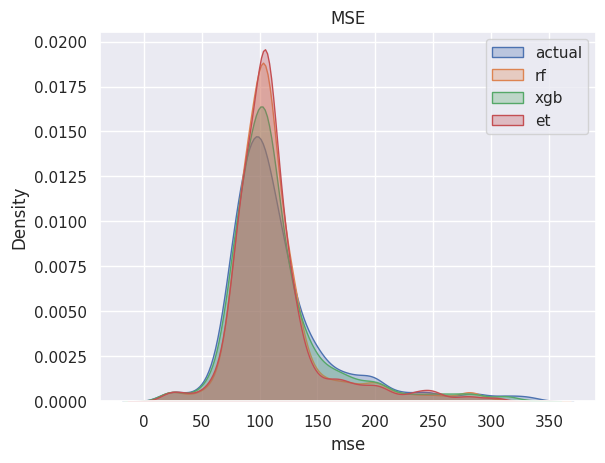

In [ ]:
sns.kdeplot(data = PEF_test, x = 'mse', label = 'actual', fill = True, alpha = 0.3)
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
  sns.kdeplot(MSE_clf, label = f'{name}', fill = True, alpha = 0.3)
plt.title('MSE')
plt.legend()
plt.show()
None

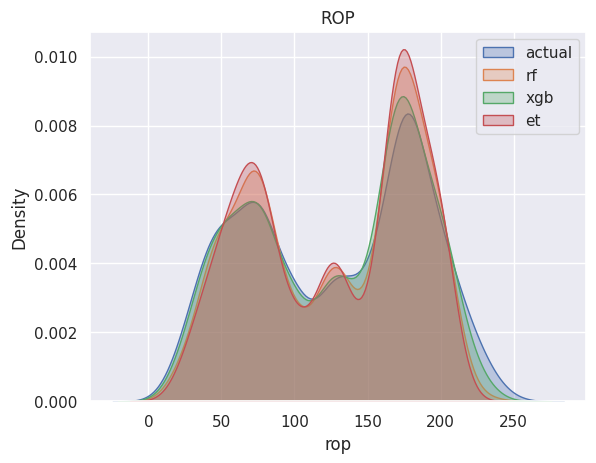

In [ ]:
sns.kdeplot(data = PEF_test, x = 'p', label = 'actual', fill = True, alpha = 0.3)
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  sns.kdeplot(ROP_clf, label = f'{name}', fill = True, alpha = 0.3)
plt.title('ROP')
plt.xlabel('rop')
plt.legend()
plt.show()
None

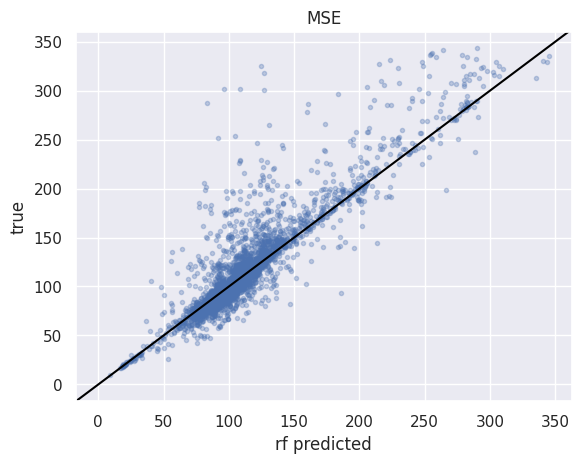

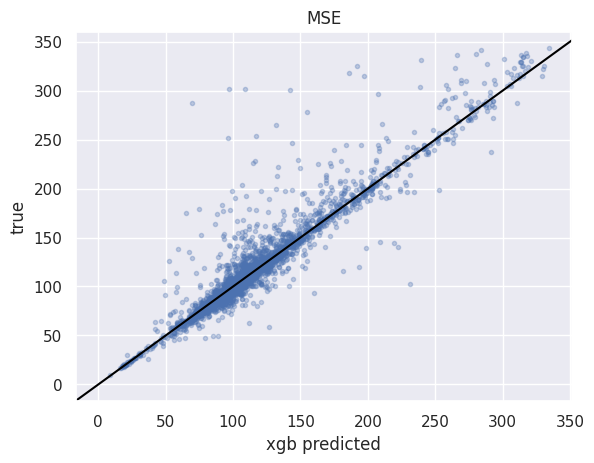

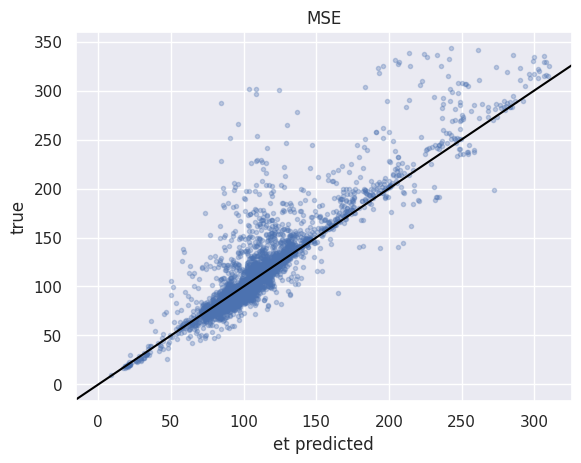

In [ ]:
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
  plt.plot(MSE_clf, PEF_test.values[:,1], '.', alpha = 0.3)
  plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
  plt.title('MSE')
  plt.xlabel(f'{name} predicted')
  plt.ylabel('true')
  # plt.xlim([0,375])
  # plt.ylim([0,400])
  plt.show()

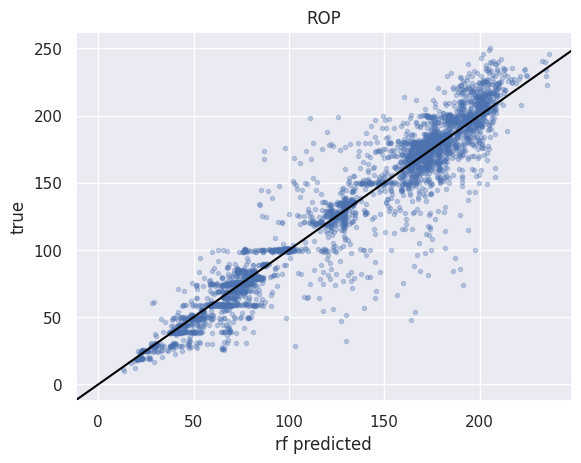

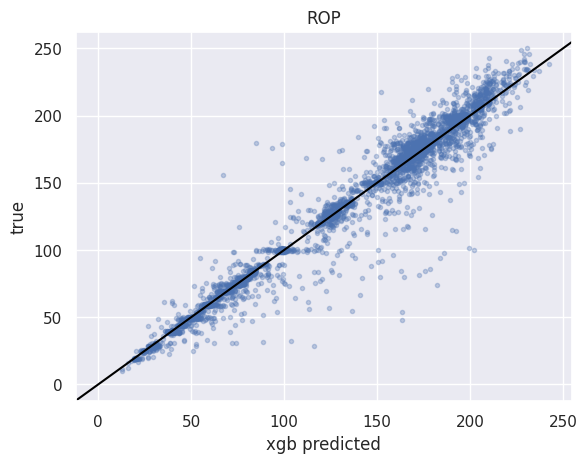

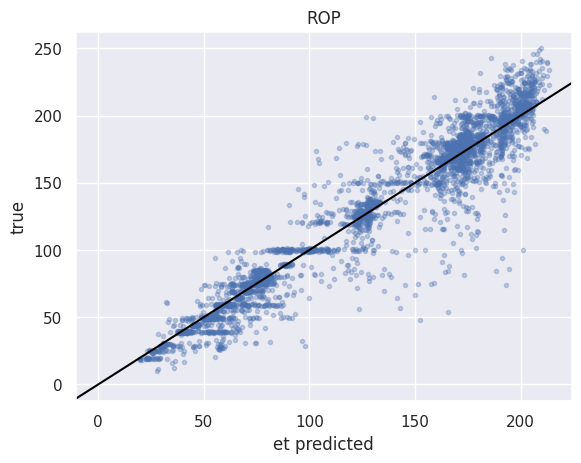

In [ ]:
for (name, clf) in estimators_stacking_para:
  y_pred_clf = clf.predict(X_test)
  # print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
  ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
  # MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
  plt.plot(ROP_clf, PEF_test.values[:,0], '.', alpha = 0.3)
  plt.axline((0, 0), slope=1, linestyle = '-', color = 'black')
  # plt.plot(ROP_value, ROP_value, 'k-')
  plt.title('ROP')
  plt.xlabel(f'{name} predicted')
  plt.ylabel('true')
  plt.show()

## Stacking

In [ ]:
def build_model():
  """
  functional api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  input = keras.layers.Input(shape=X_train.shape[1])
  N = layers.BatchNormalization()(input)

  H1 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(N)

  H2 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
                kernel_regularizer = regularizer)(H1)


  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=3,
    min_delta=0.001,
    start_from_epoch = 30,
    restore_best_weights=True,
)

In [ ]:
model = build_model()

In [ ]:
tic = perf_counter()
history = model.fit(
    X_train, y_train,
#     validation_data=(X_valid, y_valid),
    validation_split=0.2,
    batch_size=32,
    epochs=200,
    callbacks=[early_stopping],
)
toc = perf_counter()
print(f'Elapsed time: {toc - tic :.3f} sec, {(toc - tic)/60 :.3f} min')


Epoch 1/200
384/384 [==============================] - 3s 5ms/step - loss: 0.7470 - root_mean_squared_error: 2.0723 - val_loss: 0.2618 - val_root_mean_squared_error: 0.8948
Epoch 2/200
384/384 [==============================] - 2s 6ms/step - loss: 0.3090 - root_mean_squared_error: 0.9681 - val_loss: 0.3029 - val_root_mean_squared_error: 0.9308
Epoch 3/200
384/384 [==============================] - 3s 7ms/step - loss: 0.2970 - root_mean_squared_error: 0.9477 - val_loss: 0.2404 - val_root_mean_squared_error: 0.8316
Epoch 4/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2822 - root_mean_squared_error: 0.9221 - val_loss: 0.2519 - val_root_mean_squared_error: 0.8458
Epoch 5/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2806 - root_mean_squared_error: 0.9217 - val_loss: 0.2584 - val_root_mean_squared_error: 0.8410
Epoch 6/200
384/384 [==============================] - 2s 5ms/step - loss: 0.2657 - root_mean_squared_error: 0.8945 - val_loss: 0.2251 

In [ ]:
y_pred = model.predict(X_test)
y_train1 = model.predict(X_train)

479/479 [==============================] - 1s 2ms/step


In [ ]:
def aggregate(y1, y2):
    X = None
    if y1 is None:
        X = y2
    if y2 is None:
        X = y1
    if X is None:
        X = np.concatenate((y1,y2), axis = 1)
    return X

In [ ]:
X_train_layer2 = y_train1.copy()
X_test_layer2 = y_pred.copy()
for (name, clf) in estimators_stacking_para:
  y_train_clf = clf.predict(X_train)
  X_train_layer2 = aggregate(X_train_layer2, y_train_clf)
  y_pred_clf = clf.predict(X_test)
  X_test_layer2 = aggregate(X_test_layer2, y_pred_clf)

In [ ]:
DT_search = GridSearchCV(DecisionTreeRegressor(random_state = SEED), dict(max_depth = [9,12,15,17]), cv = 5).fit(X_train_layer2, y_train)

In [ ]:
DT_best = DT_search.best_estimator_

In [ ]:
DT_search.best_estimator_

DecisionTreeRegressor(max_depth=17, random_state=0)

loss: 24.79195213317871, Nloss: 0.10121532529592514
loss: 25.00762939453125, Nloss: 0.07651732116937637


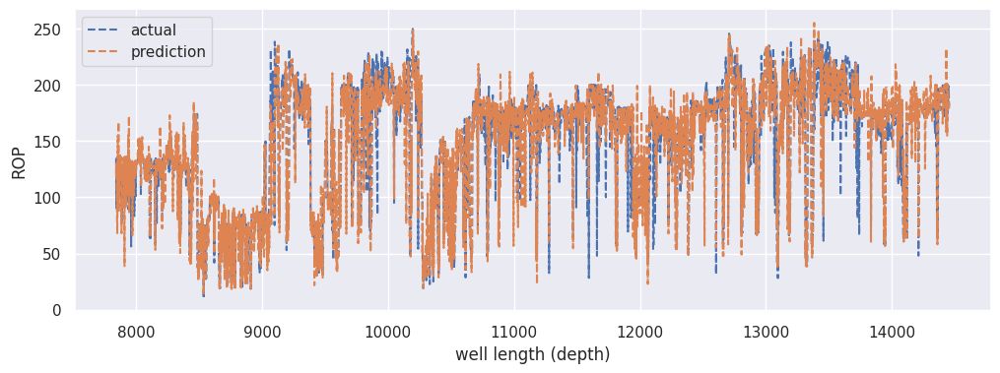

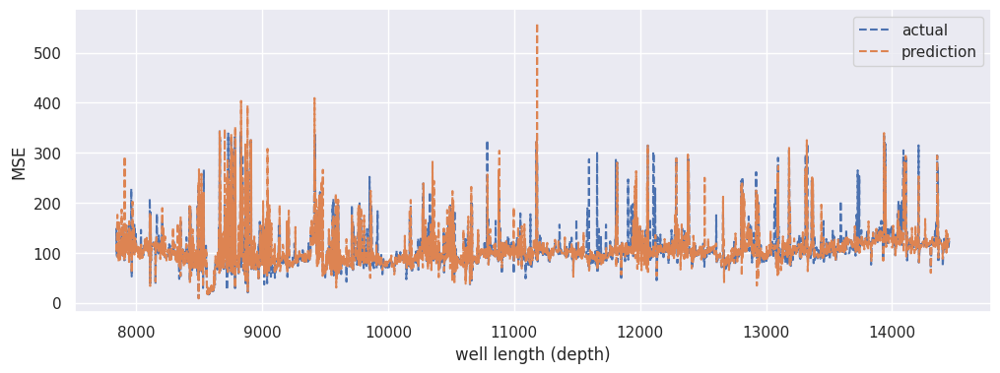

In [ ]:
y_pred_clf = DT_best.predict(X_test_layer2)
# print(f'{name} with {mean_squared_error(y_test, y_pred_clf, squared = False, multioutput = "raw_values")}')
ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
print(f'loss: {loss_fct(PEF_test.values[:,0], ROP_clf)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_clf) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
print(f'loss: {loss_fct(PEF_test.values[:,1], MSE_clf)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_clf) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], ROP_clf[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], MSE_clf[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [ ]:
clf_stacking = StackingRegressor(estimators = estimators_stacking_para, final_estimator = DT_best, cv = 5)

In [ ]:
# MultiOutputRegressor(clf_stacking).fit(X_train, y_train)

MultiOutputRegressor(estimator=StackingRegressor(cv=5,
                                                 estimators=[('rf',
                                                              RandomForestRegressor(max_depth=12,
                                                                                    n_estimators=250,
                                                                                    random_state=0)),
                                                             ('xgb',
                                                              XGBRegressor(base_score=None,
                                                                           booster=None,
                                                                           callbacks=None,
                                                                           colsample_bylevel=None,
                                                                           colsample_bynode=None,
                                                                           colsample_bytree=None,
                                                                           early_stopping_rounds=None,
                                                                           enable_categorical=False,
                                                                           eval_metric=None,
                                                                           feature_t...
                                                                           max_cat_to_onehot=None,
                                                                           max_delta_step=None,
                                                                           max_depth=12,
                                                                           max_leaves=None,
                                                                           min_child_weight=None,
                                                                           missing=nan,
                                                                           monotone_constraints=None,
                                                                           n_estimators=100,
                                                                           n_jobs=None,
                                                                           num_parallel_tree=None,
                                                                           predictor=None,
                                                                           random_state=0, ...)),
                                                             ('et',
                                                              ExtraTreesRegressor(max_depth=12,
                                                                                  n_estimators=500,
                                                                                  random_state=0))],
                                                 final_estimator=DecisionTreeRegressor(max_depth=17,
                                                                                       random_state=0)))

loss: 25.126649856567383, Nloss: 0.1033441498875618
loss: 25.202098846435547, Nloss: 0.07651732861995697


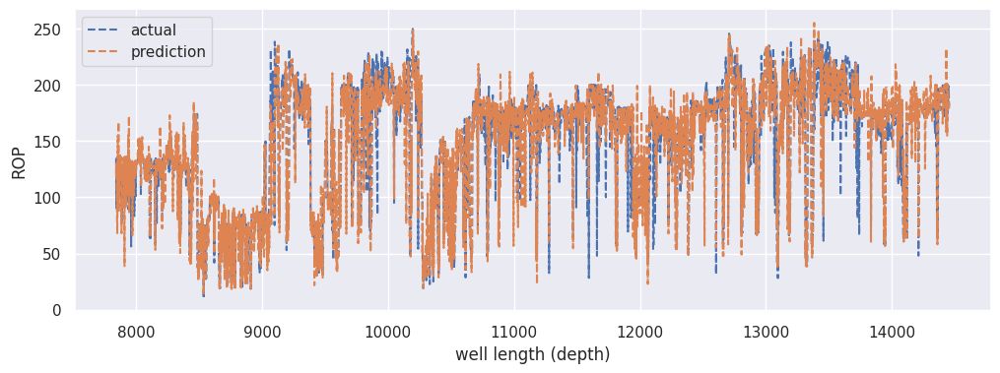

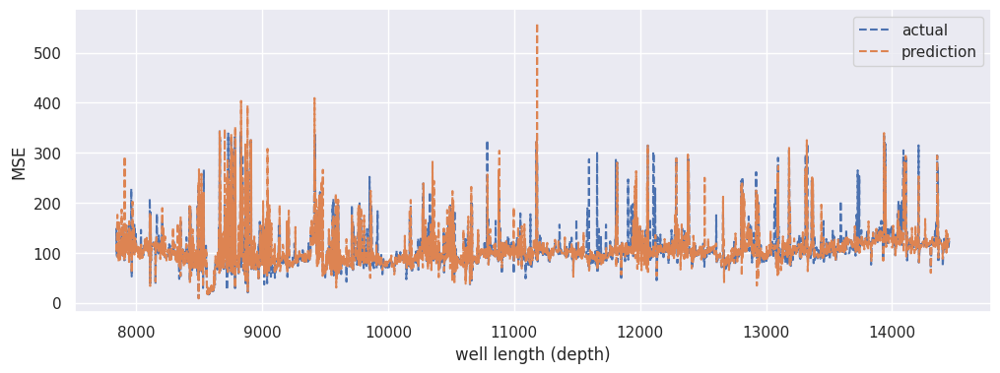

In [ ]:
pred_clf = MultiOutputRegressor(clf_stacking).fit(X_train, y_train).predict(X_test)
ROP_clf = ROP(y_pred_clf[:,-1], X_test[:,2], X_test[:,3])
MSE_clf = MSE(ROP_clf, y_pred_clf[:,0], X_test[:,1], X_test[:,2], X_test[:,3], dp_test[:])
print(f'loss: {loss_fct(PEF_test.values[:,0], ROP_clf)}, Nloss: {loss_fct(PEF_test.values[:,0], ROP_clf) / (np.max(PEF_test.values[:,0]) - np.min(PEF_test.values[:,0]) )}') ## ROP error
print(f'loss: {loss_fct(PEF_test.values[:,1], MSE_clf)}, Nloss: {loss_fct(PEF_test.values[:,1], MSE_clf) / (np.max(PEF_test.values[:,1]) - np.min(PEF_test.values[:,1]) )}') ## MSE
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,0][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], ROP_clf[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('ROP')
plt.legend()
plt.show()
plt.figure(figsize=(12,4))
plt.plot(X_test[:,0][well_length_test_idx], PEF_test.values[:,1][well_length_test_idx],'--', label = 'actual')
plt.plot(X_test[:,0][well_length_test_idx], MSE_clf[well_length_test_idx],'--', label = 'prediction')
plt.xlabel('well length (depth)')
plt.ylabel('MSE')
plt.legend()
plt.show()

# Feature Importance

In [ ]:
# pip install eli5

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
import eli5
from eli5.sklearn import PermutationImportance

IMP targets

In [ ]:
df_small.columns.tolist()[:4]

['ld', 'w', 'r', 'f']

In [ ]:
feature_names = np.array(['well length', 'wob', 'rpm', 'flow'])

In [ ]:
y_train = IMP_train.values[:,[0,2]]
y_test = IMP_test.values[:,[0,2]]
# y_train = PEF_train.values
# y_test = PEF_test.values

In [ ]:
if len(y_train.shape) ==1:
  y_train = y_train.reshape(-1,1)
  y_test = y_test.reshape(-1,1)

In [ ]:
def build_model():
  """
  sequential api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  # input = keras.layers.Input(shape=X_train.shape[1])
  model = keras.Sequential([

    layers.BatchNormalization(),

    layers.Dense(units, activation = activation, kernel_initializer=initializer,
                  kernel_regularizer = regularizer),

    layers.Dense(units, activation = activation, kernel_initializer=initializer,
                  kernel_regularizer = regularizer),

    layers.Dense(units = y_train.shape[1], activation = 'softplus')

    ])
  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  # output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  # model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
my_model = KerasRegressor(build_fn=build_model)
my_model.fit(X_train,y_train)

479/479 [==============================] - 3s 4ms/step - loss: 0.5872 - root_mean_squared_error: 1.6707


In [ ]:
perm = PermutationImportance(my_model, random_state= SEED, n_iter = 20).fit(X_test,y_test)

120/120 [==============================] - 0s 2ms/step - loss: 0.3753 - root_mean_squared_error: 1.1281


In [ ]:
perm.results_

[array([0.76796734, 0.69635713, 0.04281726, 0.04466593]),
 array([0.75269067, 0.72527468, 0.04601866, 0.04757041]),
 array([0.75972962, 0.72309566, 0.04088885, 0.04805532]),
 array([0.76984143, 0.71211767, 0.0415659 , 0.04460859]),
 array([0.74924183, 0.72439742, 0.0423584 , 0.04785296]),
 array([0.78098011, 0.70990765, 0.04581854, 0.04454589]),
 array([0.75399959, 0.71453559, 0.03968382, 0.0482842 ]),
 array([0.76667428, 0.71293485, 0.0449656 , 0.04268605]),
 array([0.75387311, 0.72964263, 0.04666349, 0.04768133]),
 array([0.76387727, 0.72298026, 0.04743907, 0.04540512]),
 array([0.76492083, 0.71609139, 0.04532745, 0.04773286]),
 array([0.75853372, 0.72235262, 0.04709336, 0.04917428]),
 array([0.7692343 , 0.73829579, 0.03995454, 0.04504204]),
 array([0.74726248, 0.72020721, 0.04690179, 0.04317844]),
 array([0.75895894, 0.71242404, 0.04742748, 0.05112776]),
 array([0.76378894, 0.72542441, 0.04653189, 0.05130777]),
 array([0.76407814, 0.70516193, 0.03910777, 0.04523927]),
 array([0.7608

In [ ]:
perm.feature_importances_

array([0.76279239, 0.71839955, 0.04389105, 0.04692101])

In [ ]:
perm.feature_importances_std_

array([0.0090239 , 0.00909222, 0.00276006, 0.00234172])

In [ ]:
# eli5.show_weights(perm, feature_names = X_train.columns.tolist())
# eli5.show_weights(perm)
eli5.show_weights(perm, feature_names = feature_names)
## explaining the metric (RMSE)

Weight,Feature
0.7628 ± 0.0180,well length
0.7184 ± 0.0182,wob
0.0469 ± 0.0047,flow
0.0439 ± 0.0055,rpm


In [ ]:
sorted_idx = np.argsort(perm.feature_importances_)

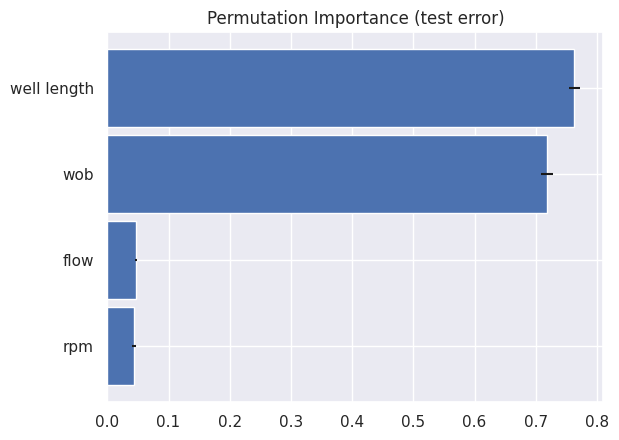

In [ ]:
plt.barh(y = np.linspace(0, 1,4) , width = perm.feature_importances_[sorted_idx], height = 0.3,
         tick_label = feature_names[sorted_idx],
         xerr = perm.feature_importances_std_[sorted_idx])
plt.title('Permutation Importance (test error)')
None  ### error bar is 1 standard deviation

PEF targets

In [ ]:
# y_train = IMP_train.values[:,[0,2]]
# y_test = IMP_test.values[:,[0,2]]
y_train = PEF_train.values
y_test = PEF_test.values

In [ ]:
if len(y_train.shape) ==1:
  y_train = y_train.reshape(-1,1)
  y_test = y_test.reshape(-1,1)

In [ ]:
def build_model():
  """
  sequential api
  """
  # lr = hp.Float('lr', min_value = 1e-4, max_value = 1e-2, sampling = 'linear')

  initializer = keras.initializers.HeNormal(seed = SEED)
  regularizer = None #keras.regularizers.L1(l1=0.001)
  activation = 'elu'  #'relu'
  loss =  'huber_loss' # 'mean_absolute_error'  #'mean_squared_error'
  metrics = [keras.metrics.RootMeanSquaredError()]

  units = 256
  # input = keras.layers.Input(shape=X_train.shape[1])
  model = keras.Sequential([

    layers.BatchNormalization(),

    layers.Dense(units, activation = activation, kernel_initializer=initializer,
                  kernel_regularizer = regularizer),

    layers.Dense(units, activation = activation, kernel_initializer=initializer,
                  kernel_regularizer = regularizer),

    layers.Dense(units = y_train.shape[1], activation = 'softplus')

    ])
  # H3 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H2)

  # H4 = layers.Dense(units, activation = activation, kernel_initializer=initializer,
  #               kernel_regularizer = regularizer)(H3)

  # concat = keras.layers.Concatenate()([N, H2])


  # output = layers.Dense(units = y_train.shape[1], activation = 'softplus')(H2)
  # output = layers.Dense(units = y_train.shape[1], activation = pos_elu)(H2)
  # output = layers.Dense(units = y_train.shape[1])(H2)
  # model = keras.models.Model(inputs=[input], outputs=[output])


  # lr_schedule = keras.optimizers.schedules.ExponentialDecay(
  #     initial_learning_rate= lr,
  #     decay_steps=100000,
  #     decay_rate=0.96)

  model.compile(
      # optimizer='adam',
      optimizer = keras.optimizers.Adam(learning_rate= 0.001), ## 0.001 works well, had issues with 0.0001
      # optimizer = keras.optimizers.Adam(learning_rate= lr_schedule),
      # optimizer = keras.optimizers.Nadam(learning_rate= lr),
      loss= loss,
      metrics=metrics,
      # loss_weights = [0.5, 0.5],
      )

  return model

# model.summary()

In [ ]:
my_model = KerasRegressor(build_fn=build_model)
my_model.fit(X_train,y_train)

479/479 [==============================] - 3s 4ms/step - loss: 39.7752 - root_mean_squared_error: 57.9153


In [ ]:
perm = PermutationImportance(my_model, random_state= SEED, n_iter = 20).fit(X_test,y_test)

120/120 [==============================] - 0s 3ms/step - loss: 31.6709 - root_mean_squared_error: 44.6175


In [ ]:
perm.results_

[array([ 3.4905529 , 14.25583267,  6.96352386,  6.2841835 ]),
 array([ 3.3802166 , 15.37172318,  7.07315063,  6.53884125]),
 array([ 3.48930931, 14.7999382 ,  7.37610626,  6.42643356]),
 array([ 3.34237671, 14.35400391,  7.46457672,  6.85572815]),
 array([ 3.33201599, 15.07617188,  7.01125336,  6.49279213]),
 array([ 3.44810295, 14.71930695,  7.34349442,  6.33968163]),
 array([ 3.14943123, 14.83558655,  7.27278137,  6.37409782]),
 array([ 3.26726723, 14.94594193,  7.10998154,  6.3154583 ]),
 array([ 3.50621223, 15.26834106,  7.36877823,  6.59335327]),
 array([ 3.41886139, 15.11394882,  7.20245361,  6.43666649]),
 array([ 3.39383125, 15.02256393,  7.3612442 ,  6.08909798]),
 array([ 3.24225235, 15.09999847,  7.28004074,  6.52666664]),
 array([ 3.17238426, 15.13915634,  7.15765762,  6.23743439]),
 array([ 3.24185181, 14.85723877,  7.43927765,  6.32172585]),
 array([ 3.3876133 , 14.5966835 ,  7.12010193,  6.60050011]),
 array([ 3.41100693, 14.68838882,  7.52200317,  6.35558128]),
 array([

In [ ]:
perm.feature_importances_

array([ 3.34422283, 14.83442726,  7.25131893,  6.39493179])

In [ ]:
perm.feature_importances_std_

array([0.1061108 , 0.29312463, 0.14899895, 0.18528644])

In [ ]:
# eli5.show_weights(perm, feature_names = X_train.columns.tolist())
# eli5.show_weights(perm)
eli5.show_weights(perm, feature_names = feature_names)
## explaining the metric (RMSE)

Weight,Feature
14.8344 ± 0.5862,wob
7.2513 ± 0.2980,rpm
6.3949 ± 0.3706,flow
3.3442 ± 0.2122,well length


In [ ]:
sorted_idx = np.argsort(perm.feature_importances_)

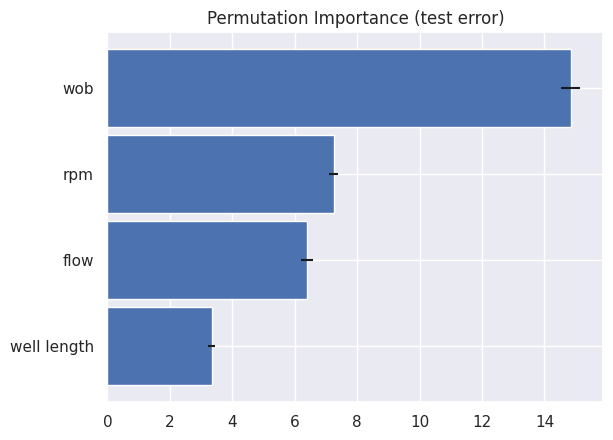

In [ ]:
plt.barh(y = np.linspace(0, 1,4) , width = perm.feature_importances_[sorted_idx], height = 0.3,
         tick_label = feature_names[sorted_idx],
         xerr = perm.feature_importances_std_[sorted_idx])
plt.title('Permutation Importance (test error)')
None

# Drawing Functions

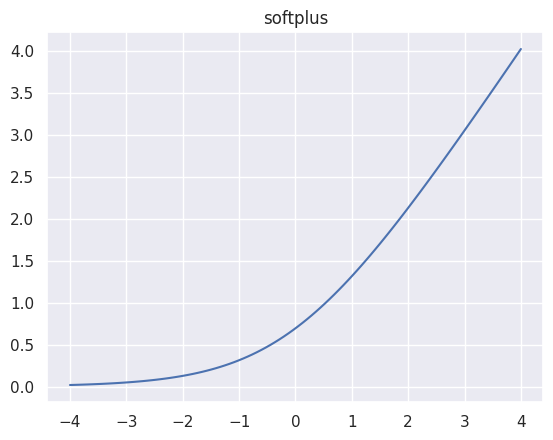

In [ ]:
# a = [-20, -1.0, 0.0, 1.0, 20]
a = np.linspace(-4,4,100)
b = keras.activations.softplus(a)
plt.plot(a,b)
plt.title('softplus')
plt.show()

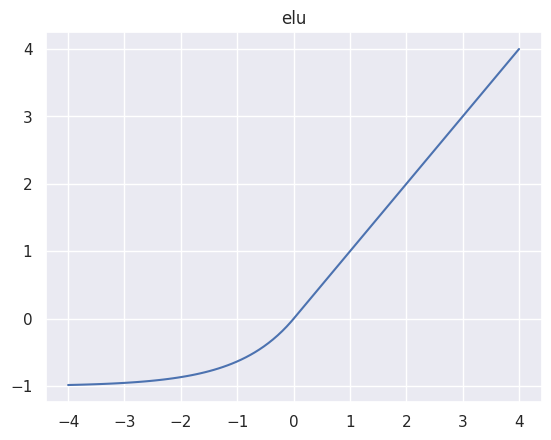

In [ ]:
# a = [-4, -1.0, 0.0, 1.0, 4]
a = np.linspace(-4,4,100)
b = keras.activations.elu(a, alpha=1.0)
plt.plot(a,b)
plt.title('elu')
plt.show()

# End